In [1]:
import geopandas as gpd
import matplotlib.pyplot as plt
import pandas as pd
import scanpy as sc
from tqdm import tqdm

from cellseg_benchmark.adata_utils import plot_spatial_multiplot
from cellseg_benchmark.spatial_mapping import (
    _overlay_polygons,
    _show_grid,
    map_points_to_regions_from_anndata,
    plot_progress_pipeline,
    plot_slide_regions,
    polygons_per_component_exact,
    relabel_small_holes,
    remove_small_islands,
    to_gdf,
)

In [3]:
adata = sc.read_h5ad(
    "/dss/dsshome1/00/ra87rib/cellseg-benchmark/analysis/foxf2/Negative_Control_Rastered_25/spatial_reg_adata_7.h5ad"
)
adata

AnnData object with n_obs × n_vars = 490661 × 500
    obs: 'region', 'slide', 'cell_type_mmc_incl_low_quality_revised', 'cell_type_mmc_incl_low_quality_clusters', 'cell_type_mmc_incl_low_quality', 'cell_type_mmc_incl_mixed_revised', 'cell_type_mmc_incl_mixed_clusters', 'cell_type_mmc_incl_mixed', 'cell_type_mmc_raw_revised', 'cell_type_mmc_raw_clusters', 'cell_type_mmc_raw', 'area', 'volume_sum', 'volume_final', 'num_z_planes', 'size_normalized', 'surface_to_volume_ratio', 'sphericity', 'solidity', 'elongation', 'genotype', 'age_months', 'run_date', 'animal_id', 'organism', 'cohort', 'sample', 'n_counts', 'n_genes', 'condition', 'spatial_outlier', 'low_quality_cell', 'volume_outlier_cell', 'fov', 'leiden_res0_25', 'banksy_joined_M0_lam1_k30_res0.2', 'banksy_joined_M0_lam1_k30_res0.4', 'banksy_joined_M0_lam1_k50_res0.2', 'banksy_joined_M0_lam1_k50_res0.4', 'banksy_joined_M0_lam1_k60_res0.2', 'banksy_joined_M0_lam1_k60_res0.4', 'banksy_joined_M0_lam1_k75_res0.2', 'banksy_joined_M0_lam1_k

In [4]:
min_hole_area_um2_col = {}
min_island_area_um2_col = {}
for sample in adata.obs["sample"].unique():
    if sample == "foxf2_s1_r1":
        min_hole_area_um2_col[sample] = 10000.0
        min_island_area_um2_col[sample] = 20000.0
    else:
        min_hole_area_um2_col[sample] = 150000.0
        min_island_area_um2_col[sample] = 60000.0

  0%|          | 0/13 [00:00<?, ?it/s]

foxf2_s7_r0


  8%|▊         | 1/13 [00:05<01:02,  5.23s/it]

foxf2_s1_r1


 15%|█▌        | 2/13 [00:09<00:52,  4.73s/it]

foxf2_s7_r1


 23%|██▎       | 3/13 [00:13<00:43,  4.40s/it]

foxf2_s1_r0


 31%|███       | 4/13 [00:17<00:37,  4.12s/it]

foxf2_s4_r0


 38%|███▊      | 5/13 [00:21<00:33,  4.16s/it]

foxf2_s5_r0


 46%|████▌     | 6/13 [00:24<00:27,  3.88s/it]

foxf2_s6_r2


 54%|█████▍    | 7/13 [00:28<00:22,  3.83s/it]

foxf2_s2_r2


 62%|██████▏   | 8/13 [00:32<00:18,  3.73s/it]

foxf2_s2_r1


 69%|██████▉   | 9/13 [00:35<00:14,  3.69s/it]

foxf2_s4_r1


 77%|███████▋  | 10/13 [00:38<00:10,  3.51s/it]

foxf2_s6_r0


 85%|████████▍ | 11/13 [00:41<00:06,  3.29s/it]

foxf2_s6_r1


 92%|█████████▏| 12/13 [00:45<00:03,  3.56s/it]

foxf2_s5_r1


100%|██████████| 13/13 [00:49<00:00,  3.78s/it]


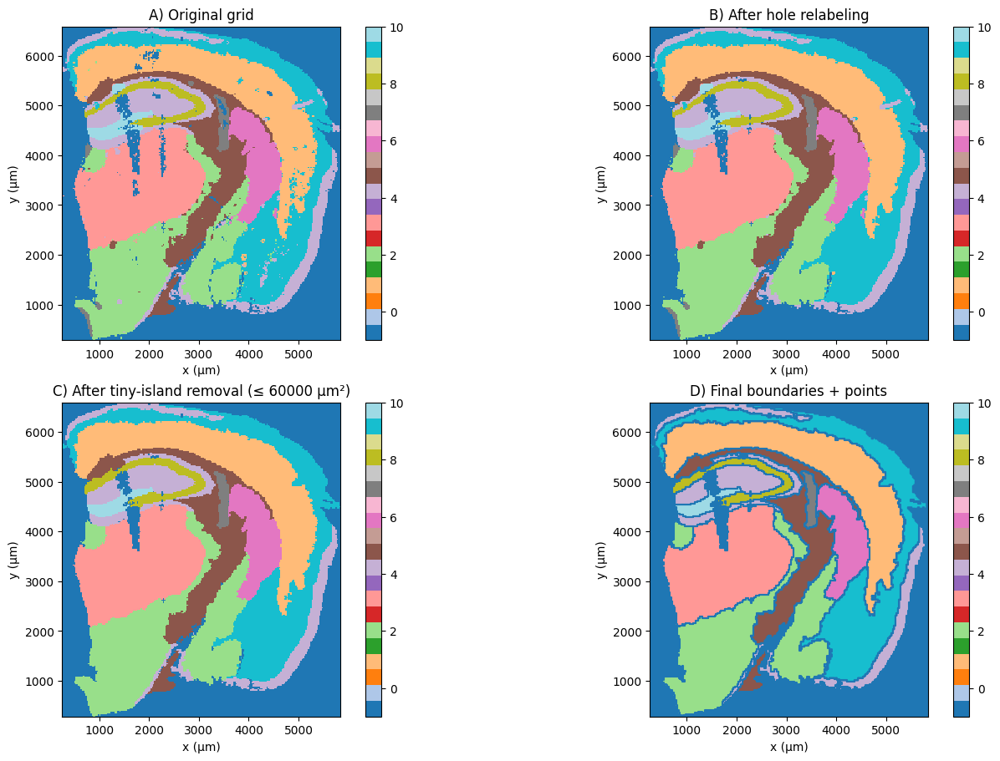

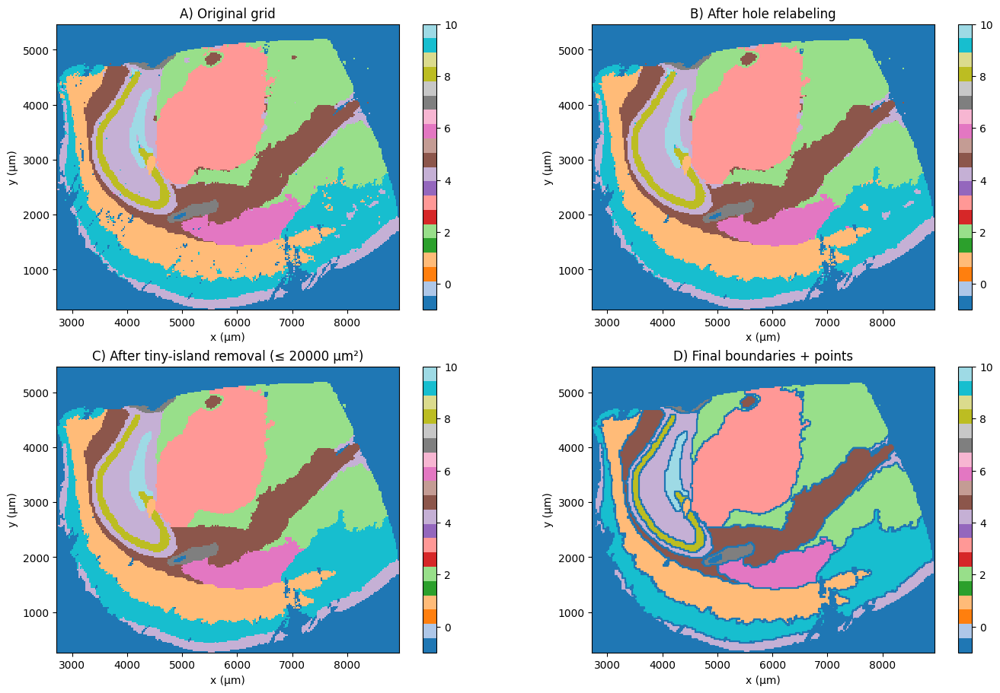

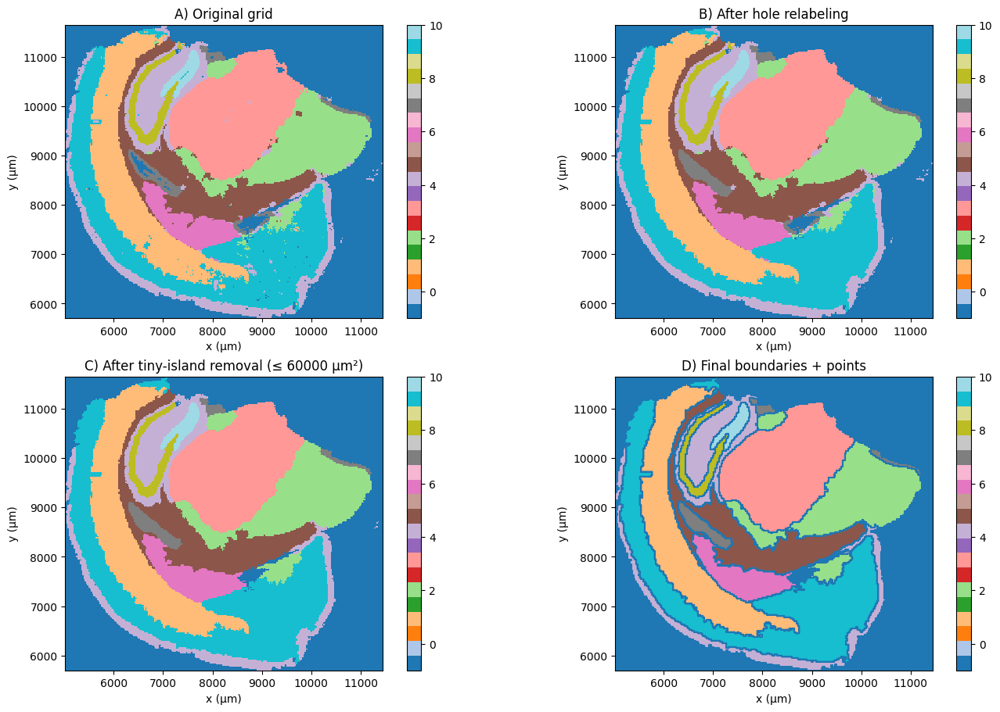

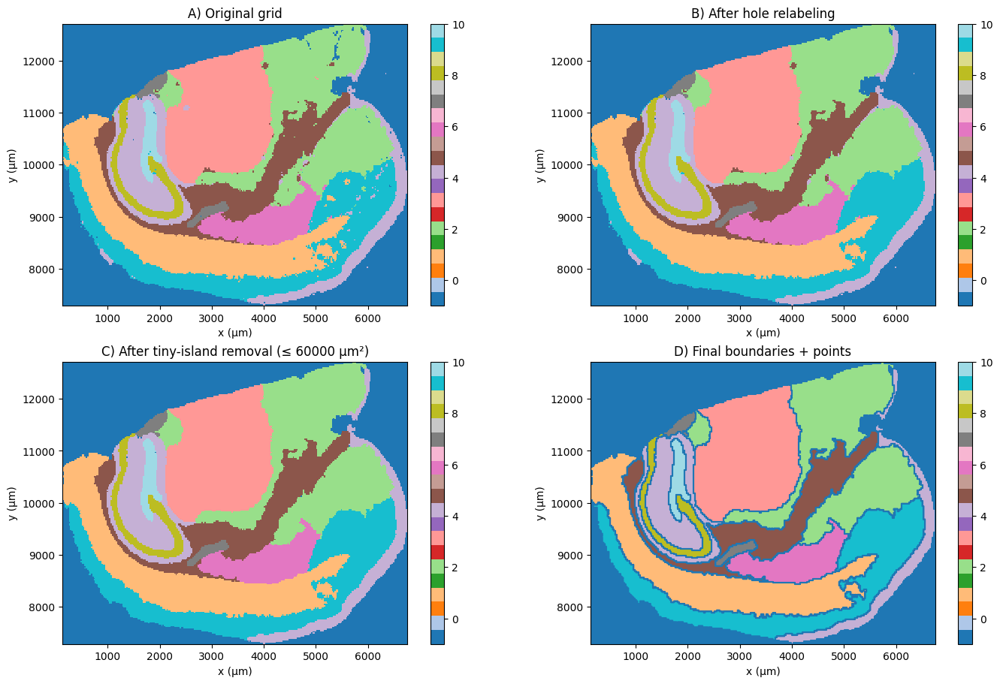

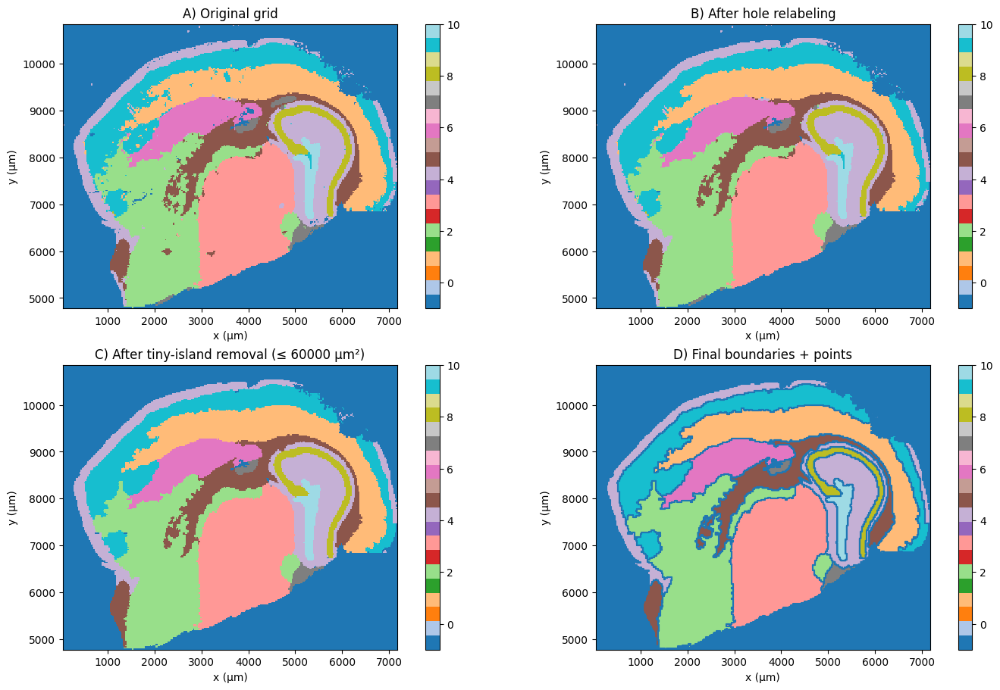

...

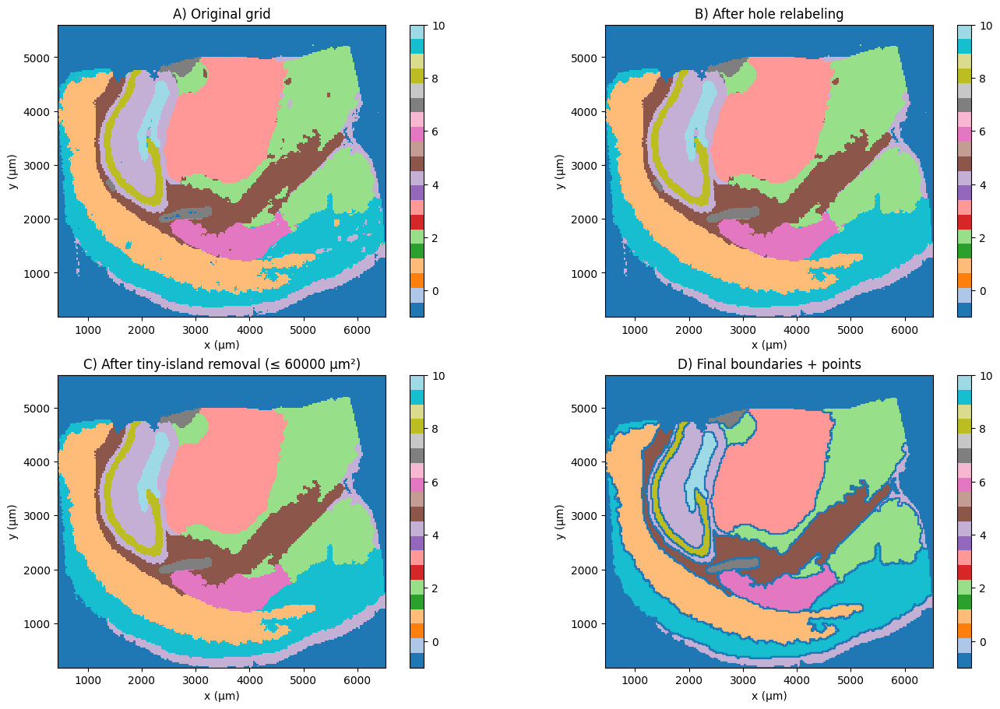

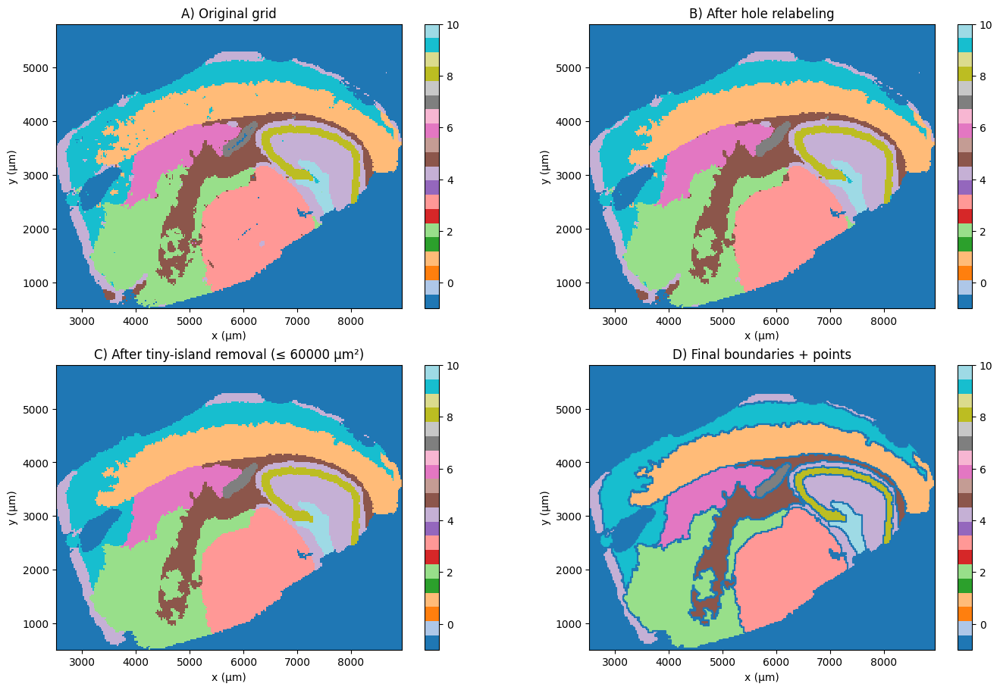

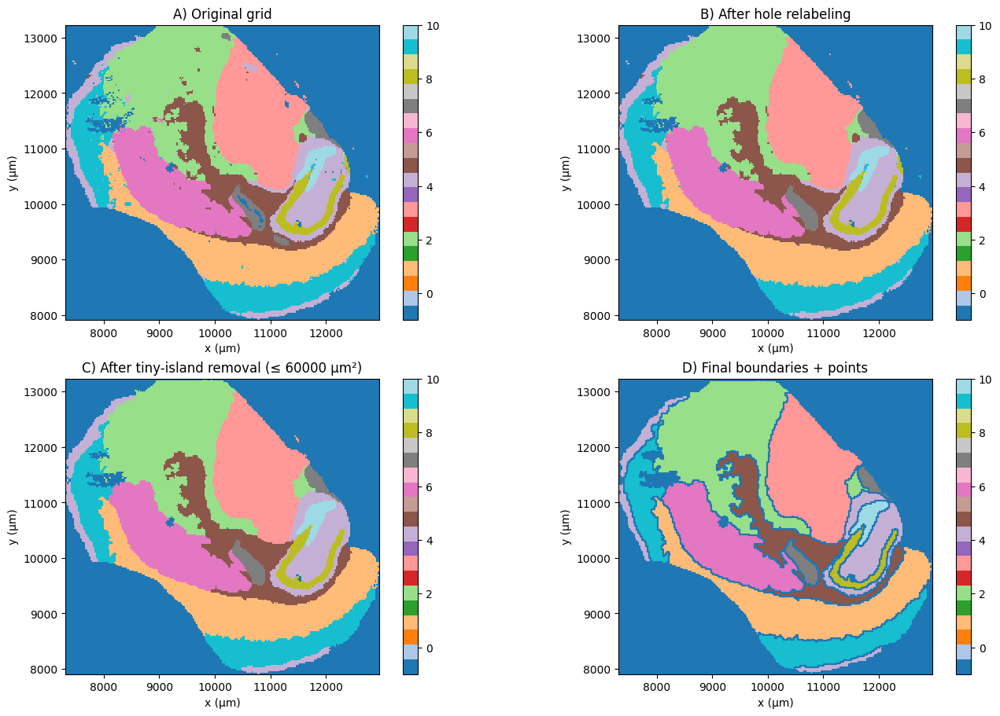

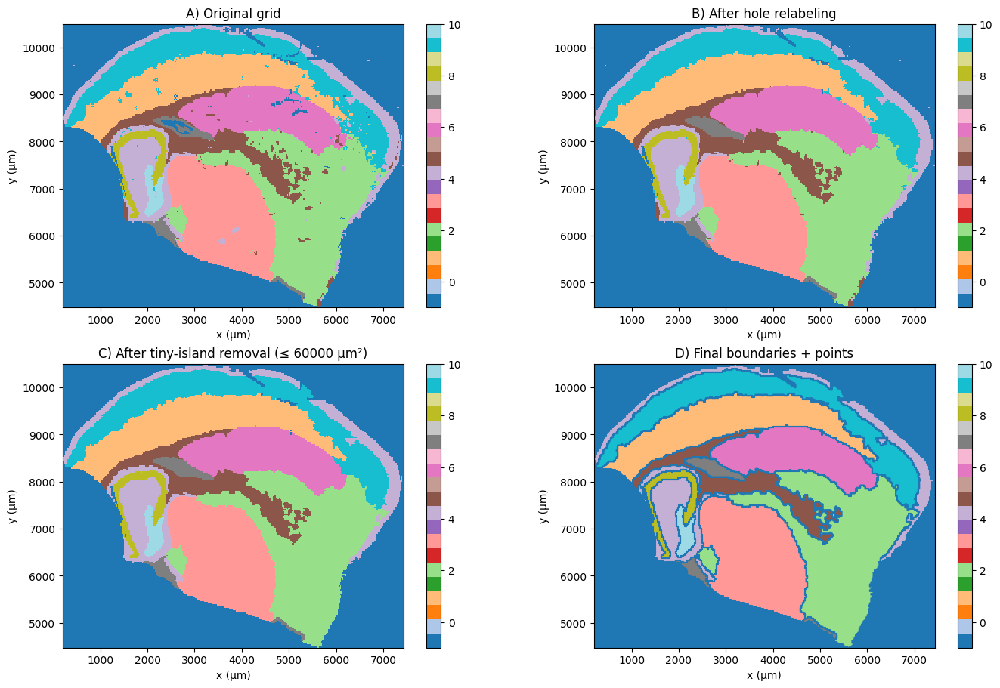

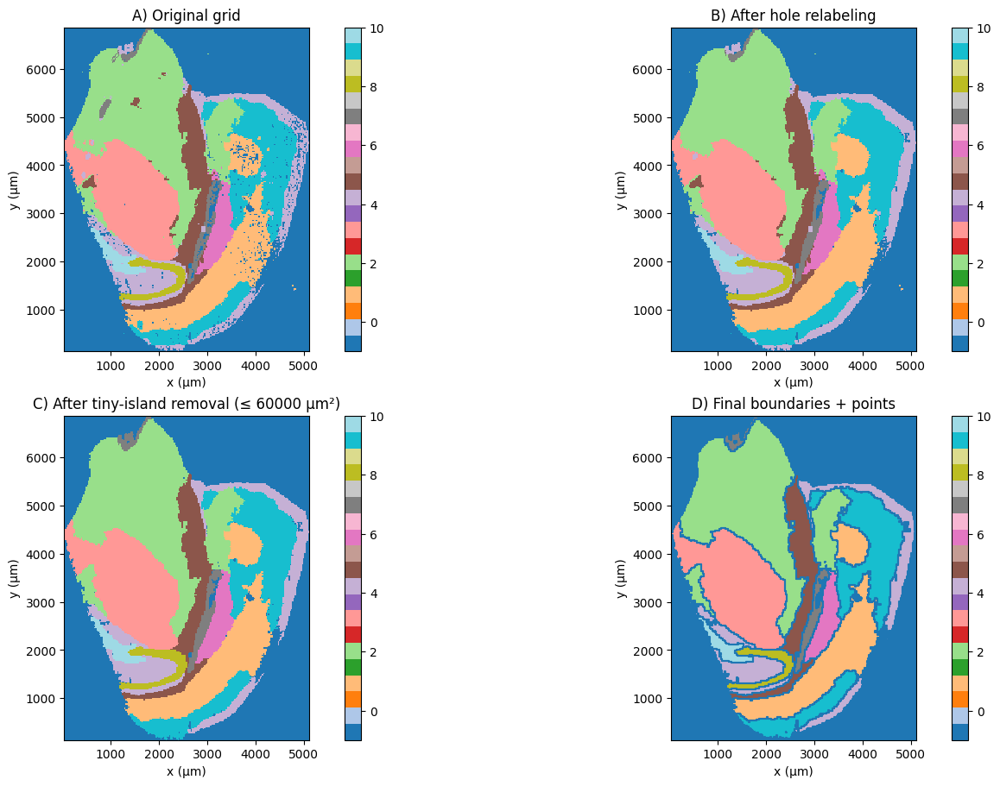

In [6]:
grids = {}
regions = {}
geos = {}

for sample in tqdm(adata.obs["sample"].unique()):
    print(sample)
    _, grid, region, _, geo = plot_progress_pipeline(
        adata,
        sample,
        "banksy_joined_M1_lam1_k75_res0.4",
        relabel_func=relabel_small_holes,
        remove_islands_func=remove_small_islands,
        polygonize_func=polygons_per_component_exact,
        min_hole_area_um2=min_hole_area_um2_col[sample],
        min_island_area_um2=min_island_area_um2_col[sample],
        # save=f"/dss/dsshome1/00/ra87rib/cellseg-benchmark/misc/banksy_tests/postprocessing/{sample}.png"
    )
    grids[sample] = grid
    regions[sample] = region
    geos[sample] = geo

In [7]:
anatom_annot = {}

<Axes: xlabel='x (µm)', ylabel='y (µm)'>

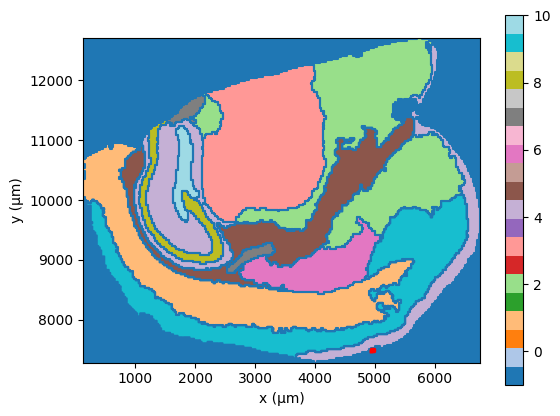

In [8]:
sample = "foxf2_s1_r0"
grid = grids[sample]
region = regions[sample]
geo = geos[sample]
fig, ax = plt.subplots()
_show_grid(grid, geo, ax=ax, cmap="tab20")
_overlay_polygons(
    region,
    ax=ax,
    highlight=(4, 3),
    highlight_edge_kw={"color": "red", "linewidth": 2.5},
)

In [9]:
anatom_annot[sample] = {}
anatom_annot[sample]["fiber_tracts"] = []
anatom_annot[sample]["HIP"] = []
anatom_annot[sample]["CAsp"] = []
anatom_annot[sample]["DG-sg"] = []
anatom_annot[sample]["CTX"] = []
anatom_annot[sample]["STR"] = []
anatom_annot[sample]["VS"] = []
anatom_annot[sample]["BS/STR"] = []
anatom_annot[sample]["BS"] = []

anatom_annot[sample]["CTX"].append(region[0]["poly"])
anatom_annot[sample]["BS"].append(region[1]["poly"])
anatom_annot[sample]["BS"].append(region[2]["poly"])
anatom_annot[sample]["STR"].append(region[3]["poly"])
anatom_annot[sample]["BS"].append(region[4]["poly"])
anatom_annot[sample]["BS"].append(region[5]["poly"])
anatom_annot[sample]["CTX"].append(region[6]["poly"])
anatom_annot[sample]["HIP"].append(region[7]["poly"])
anatom_annot[sample]["CTX"].append(region[8]["poly"])
anatom_annot[sample]["fiber_tracts"].append(region[9]["poly"])
anatom_annot[sample]["STR"].append(region[10]["poly"])
anatom_annot[sample]["VS"].append(region[11]["poly"])
anatom_annot[sample]["VS"].append(region[12]["poly"])
anatom_annot[sample]["CAsp"].append(region[13]["poly"])
anatom_annot[sample]["CTX"].append(region[14]["poly"])
anatom_annot[sample]["DG-sg"].append(region[15]["poly"])

In [10]:
sample = "foxf2_s1_r1"
grid = grids[sample]
region = regions[sample]
geo = geos[sample]
region

[{'poly': <POLYGON ((3070.108 3365.94, 3070.108 3390.942, 3095.11 3390.942, 3095.11 34...>,
  'code': 1,
  'value': 1,
  'comp_id': 0},
 {'poly': <POLYGON ((4395.185 2790.905, 4395.185 2815.906, 4370.183 2815.906, 4370.183...>,
  'code': 1,
  'value': 1,
  'comp_id': 1},
 {'poly': <POLYGON ((7170.345 1140.802, 7145.344 1140.802, 7145.344 1165.804, 7120.342...>,
  'code': 1,
  'value': 1,
  'comp_id': 2},
 {'poly': <POLYGON ((7095.341 1190.805, 7070.339 1190.805, 7070.339 1215.807, 7070.339...>,
  'code': 1,
  'value': 1,
  'comp_id': 3},
 {'poly': <POLYGON ((7070.339 1090.799, 7095.341 1090.799, 7095.341 1115.801, 7120.342...>,
  'code': 1,
  'value': 1,
  'comp_id': 4},
 {'poly': <POLYGON ((7045.338 1065.798, 7045.338 1090.799, 7020.336 1090.799, 7020.336...>,
  'code': 1,
  'value': 1,
  'comp_id': 5},
 {'poly': <POLYGON ((5220.232 2540.889, 5195.231 2540.889, 5170.23 2540.889, 5145.228 ...>,
  'code': 2,
  'value': 2,
  'comp_id': 0},
 {'poly': <POLYGON ((4520.192 3840.97, 4520.192 

<Axes: xlabel='x (µm)', ylabel='y (µm)'>

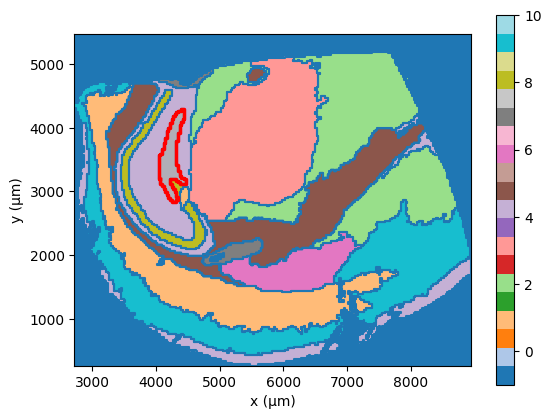

In [11]:
fig, ax = plt.subplots()
_show_grid(grid, geo, ax=ax, cmap="tab20")
_overlay_polygons(
    region,
    ax=ax,
    highlight=(10, None),
    highlight_edge_kw={"color": "red", "linewidth": 2.5},
)

In [12]:
anatom_annot[sample] = {}
anatom_annot[sample]["fiber_tracts"] = []
anatom_annot[sample]["HIP"] = []
anatom_annot[sample]["CAsp"] = []
anatom_annot[sample]["DG-sg"] = []
anatom_annot[sample]["CTX"] = []
anatom_annot[sample]["STR"] = []
anatom_annot[sample]["VS"] = []
anatom_annot[sample]["BS/STR"] = []
anatom_annot[sample]["BS"] = []

anatom_annot[sample]["CTX"].append(region[0]["poly"])
anatom_annot[sample]["CAsp"].append(region[1]["poly"])
anatom_annot[sample]["CTX"].append(region[2]["poly"])
anatom_annot[sample]["CTX"].append(region[3]["poly"])
anatom_annot[sample]["CTX"].append(region[4]["poly"])
anatom_annot[sample]["CTX"].append(region[5]["poly"])
anatom_annot[sample]["BS"].append(region[6]["poly"])
anatom_annot[sample]["BS"].append(region[7]["poly"])
anatom_annot[sample]["BS"].append(region[8]["poly"])
anatom_annot[sample]["STR"].append(region[9]["poly"])
anatom_annot[sample]["BS"].append(region[10]["poly"])
anatom_annot[sample]["HIP"].append(region[11]["poly"])
anatom_annot[sample]["BS"].append(region[12]["poly"])
anatom_annot[sample]["CTX"].append(region[13]["poly"])
anatom_annot[sample]["STR"].append(region[14]["poly"])
anatom_annot[sample]["CTX"].append(region[15]["poly"])
anatom_annot[sample]["CTX"].append(region[16]["poly"])
anatom_annot[sample]["CTX"].append(region[17]["poly"])
anatom_annot[sample]["CTX"].append(region[18]["poly"])
anatom_annot[sample]["CTX"].append(region[19]["poly"])
anatom_annot[sample]["CTX"].append(region[20]["poly"])
anatom_annot[sample]["CTX"].append(region[21]["poly"])
anatom_annot[sample]["fiber_tracts"].append(region[22]["poly"])
anatom_annot[sample]["fiber_tracts"].append(region[23]["poly"])
anatom_annot[sample]["STR"].append(region[24]["poly"])
anatom_annot[sample]["VS"].append(region[25]["poly"])
anatom_annot[sample]["VS"].append(region[26]["poly"])
anatom_annot[sample]["CAsp"].append(region[27]["poly"])
anatom_annot[sample]["CAsp"].append(region[28]["poly"])
anatom_annot[sample]["CTX"].append(region[29]["poly"])
anatom_annot[sample]["CTX"].append(region[30]["poly"])
anatom_annot[sample]["CTX"].append(region[31]["poly"])
anatom_annot[sample]["CTX"].append(region[32]["poly"])
anatom_annot[sample]["CTX"].append(region[33]["poly"])
anatom_annot[sample]["CTX"].append(region[34]["poly"])
anatom_annot[sample]["CTX"].append(region[35]["poly"])
anatom_annot[sample]["DG-sg"].append(region[36]["poly"])

In [13]:
sample = "foxf2_s2_r1"
grid = grids[sample]
region = regions[sample]
geo = geos[sample]
region

[{'poly': <POLYGON ((672.814 3152.751, 697.816 3152.751, 722.818 3152.751, 722.818 317...>,
  'code': 1,
  'value': 1,
  'comp_id': 0},
 {'poly': <POLYGON ((3172.985 2552.719, 3147.983 2552.719, 3147.983 2527.717, 3122.981...>,
  'code': 2,
  'value': 2,
  'comp_id': 0},
 {'poly': <POLYGON ((2697.953 4427.82, 2672.951 4427.82, 2672.951 4452.822, 2672.951 4...>,
  'code': 2,
  'value': 2,
  'comp_id': 1},
 {'poly': <POLYGON ((4723.091 1877.682, 4723.091 1902.684, 4723.091 1927.685, 4698.089...>,
  'code': 2,
  'value': 2,
  'comp_id': 2},
 {'poly': <POLYGON ((3948.038 1852.681, 3923.036 1852.681, 3898.034 1852.681, 3898.034...>,
  'code': 2,
  'value': 2,
  'comp_id': 3},
 {'poly': <POLYGON ((2497.939 2877.736, 2472.937 2877.736, 2472.937 2902.738, 2472.937...>,
  'code': 3,
  'value': 3,
  'comp_id': 0},
 {'poly': <POLYGON ((1322.859 2877.736, 1297.857 2877.736, 1297.857 2902.738, 1297.857...>,
  'code': 4,
  'value': 4,
  'comp_id': 0},
 {'poly': <POLYGON ((5498.143 3177.753, 5498.143

<Axes: xlabel='x (µm)', ylabel='y (µm)'>

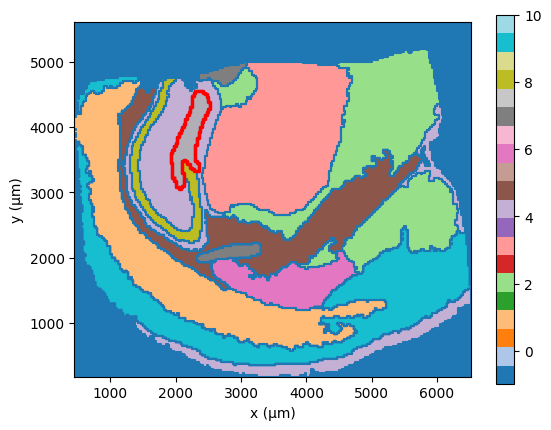

In [14]:
fig, ax = plt.subplots()
_show_grid(grid, geo, ax=ax, cmap="tab20")
_overlay_polygons(
    region,
    ax=ax,
    highlight=(10, 0),
    highlight_edge_kw={"color": "red", "linewidth": 2.5},
)

In [15]:
anatom_annot[sample] = {}
anatom_annot[sample]["fiber_tracts"] = []
anatom_annot[sample]["HIP"] = []
anatom_annot[sample]["CAsp"] = []
anatom_annot[sample]["DG-sg"] = []
anatom_annot[sample]["CTX"] = []
anatom_annot[sample]["STR"] = []
anatom_annot[sample]["VS"] = []
anatom_annot[sample]["BS/STR"] = []
anatom_annot[sample]["BS"] = []
anatom_annot[sample]["Meninges"] = []

anatom_annot[sample]["CTX"].append(region[0]["poly"])
anatom_annot[sample]["BS"].append(region[1]["poly"])
anatom_annot[sample]["BS"].append(region[2]["poly"])
anatom_annot[sample]["STR"].append(region[3]["poly"])
anatom_annot[sample]["STR"].append(region[4]["poly"])
anatom_annot[sample]["BS"].append(region[5]["poly"])
anatom_annot[sample]["HIP"].append(region[6]["poly"])
anatom_annot[sample]["Meninges"].append(region[7]["poly"])
anatom_annot[sample]["CTX"].append(region[8]["poly"])
anatom_annot[sample]["CTX"].append(region[9]["poly"])
anatom_annot[sample]["fiber_tracts"].append(region[10]["poly"])
anatom_annot[sample]["STR"].append(region[11]["poly"])
anatom_annot[sample]["VS"].append(region[12]["poly"])
anatom_annot[sample]["VS"].append(region[13]["poly"])
anatom_annot[sample]["CAsp"].append(region[14]["poly"])
anatom_annot[sample]["CTX"].append(region[15]["poly"])
anatom_annot[sample]["CTX"].append(region[16]["poly"])
anatom_annot[sample]["CTX"].append(region[17]["poly"])
anatom_annot[sample]["CTX"].append(region[18]["poly"])
anatom_annot[sample]["DG-sg"].append(region[19]["poly"])

In [16]:
sample = "foxf2_s2_r2"
grid = grids[sample]
region = regions[sample]
geo = geos[sample]
region

[{'poly': <POLYGON ((687.049 9850.688, 687.049 9875.69, 662.047 9875.69, 662.047 9900....>,
  'code': 1,
  'value': 1,
  'comp_id': 0},
 {'poly': <POLYGON ((1087.076 8325.581, 1087.076 8350.583, 1062.074 8350.583, 1062.074...>,
  'code': 1,
  'value': 1,
  'comp_id': 1},
 {'poly': <POLYGON ((2712.184 10925.763, 2687.182 10925.763, 2687.182 10950.765, 2687....>,
  'code': 2,
  'value': 2,
  'comp_id': 0},
 {'poly': <POLYGON ((3587.242 8150.569, 3587.242 8175.571, 3562.24 8175.571, 3537.238 ...>,
  'code': 2,
  'value': 2,
  'comp_id': 1},
 {'poly': <POLYGON ((2712.184 9125.637, 2712.184 9150.639, 2712.184 9175.641, 2687.182...>,
  'code': 2,
  'value': 2,
  'comp_id': 2},
 {'poly': <POLYGON ((2412.164 9425.658, 2387.162 9425.658, 2387.162 9450.66, 2387.162 ...>,
  'code': 3,
  'value': 3,
  'comp_id': 0},
 {'poly': <POLYGON ((1137.079 9750.681, 1137.079 9775.683, 1137.079 9800.684, 1137.079...>,
  'code': 4,
  'value': 4,
  'comp_id': 0},
 {'poly': <POLYGON ((1437.099 9525.665, 1437.099

<Axes: xlabel='x (µm)', ylabel='y (µm)'>

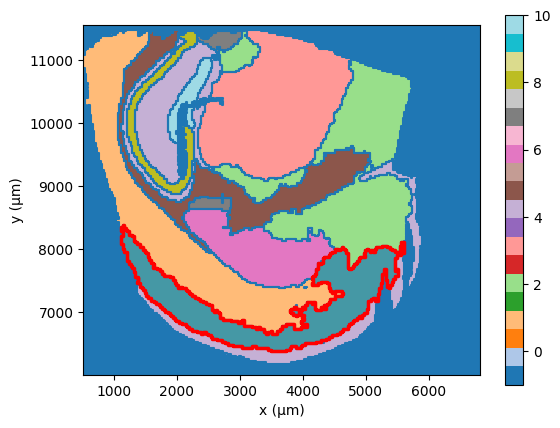

In [17]:
fig, ax = plt.subplots()
_show_grid(grid, geo, ax=ax, cmap="tab20")
_overlay_polygons(
    region,
    ax=ax,
    highlight=(9, 0),
    highlight_edge_kw={"color": "red", "linewidth": 2.5},
)

In [18]:
anatom_annot[sample] = {}
anatom_annot[sample]["fiber_tracts"] = []
anatom_annot[sample]["HIP"] = []
anatom_annot[sample]["CAsp"] = []
anatom_annot[sample]["DG-sg"] = []
anatom_annot[sample]["CTX"] = []
anatom_annot[sample]["STR"] = []
anatom_annot[sample]["VS"] = []
anatom_annot[sample]["BS/STR"] = []
anatom_annot[sample]["BS"] = []
anatom_annot[sample]["Meninges"] = []

anatom_annot[sample]["CTX"].append(region[0]["poly"])
anatom_annot[sample]["CTX"].append(region[1]["poly"])
anatom_annot[sample]["BS"].append(region[2]["poly"])
anatom_annot[sample]["BS/STR"].append(region[3]["poly"])
anatom_annot[sample]["BS"].append(region[4]["poly"])
anatom_annot[sample]["BS"].append(region[5]["poly"])
anatom_annot[sample]["HIP"].append(region[6]["poly"])
anatom_annot[sample]["HIP"].append(region[7]["poly"])
anatom_annot[sample]["HIP"].append(region[8]["poly"])
anatom_annot[sample]["Meninges"].append(region[9]["poly"])
anatom_annot[sample]["Meninges"].append(region[10]["poly"])
anatom_annot[sample]["CTX"].append(region[11]["poly"])
anatom_annot[sample]["CTX"].append(region[12]["poly"])
anatom_annot[sample]["fiber_tracts"].append(region[13]["poly"])
anatom_annot[sample]["STR"].append(region[14]["poly"])
anatom_annot[sample]["VS"].append(region[15]["poly"])
anatom_annot[sample]["VS"].append(region[16]["poly"])
anatom_annot[sample]["CAsp"].append(region[17]["poly"])
anatom_annot[sample]["CAsp"].append(region[18]["poly"])
anatom_annot[sample]["CAsp"].append(region[19]["poly"])
anatom_annot[sample]["CAsp"].append(region[20]["poly"])
anatom_annot[sample]["CAsp"].append(region[21]["poly"])
anatom_annot[sample]["CTX"].append(region[22]["poly"])
anatom_annot[sample]["DG-sg"].append(region[23]["poly"])
anatom_annot[sample]["DG-sg"].append(region[24]["poly"])
anatom_annot[sample]["DG-sg"].append(region[25]["poly"])
anatom_annot[sample]["DG-sg"].append(region[26]["poly"])

In [19]:
sample = "foxf2_s4_r0"
grid = grids[sample]
region = regions[sample]
geo = geos[sample]
region

[{'poly': <POLYGON ((1371.84 8698.982, 1371.84 8723.983, 1371.84 8748.985, 1371.84 877...>,
  'code': 1,
  'value': 1,
  'comp_id': 0},
 {'poly': <POLYGON ((771.803 7273.889, 771.803 7298.891, 746.801 7298.891, 746.801 732...>,
  'code': 2,
  'value': 2,
  'comp_id': 0},
 {'poly': <POLYGON ((2871.932 7173.883, 2846.93 7173.883, 2846.93 7198.885, 2846.93 72...>,
  'code': 2,
  'value': 2,
  'comp_id': 1},
 {'poly': <POLYGON ((4697.044 6398.833, 4697.044 6423.834, 4697.044 6448.836, 4697.044...>,
  'code': 2,
  'value': 2,
  'comp_id': 2},
 {'poly': <POLYGON ((2846.93 5273.76, 2821.929 5273.76, 2821.929 5298.761, 2821.929 53...>,
  'code': 3,
  'value': 3,
  'comp_id': 0},
 {'poly': <POLYGON ((396.78 7673.915, 396.78 7698.917, 396.78 7723.919, 396.78 7748.92...>,
  'code': 4,
  'value': 4,
  'comp_id': 0},
 {'poly': <POLYGON ((5122.07 10424.094, 5097.068 10424.094, 5072.067 10424.094, 5047.0...>,
  'code': 4,
  'value': 4,
  'comp_id': 1},
 {'poly': <POLYGON ((5122.07 10374.091, 5122.07 

<Axes: xlabel='x (µm)', ylabel='y (µm)'>

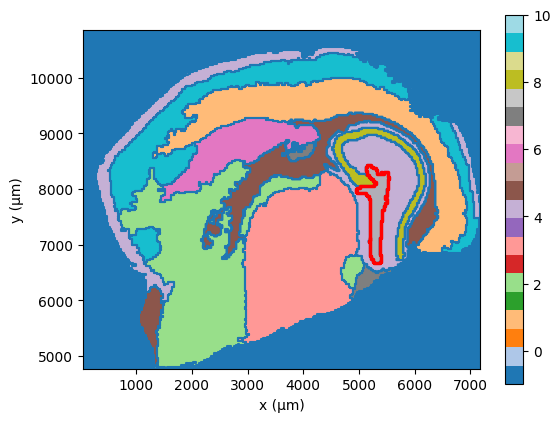

In [20]:
fig, ax = plt.subplots()
_show_grid(grid, geo, ax=ax, cmap="tab20")
_overlay_polygons(
    region,
    ax=ax,
    highlight=(10, None),
    highlight_edge_kw={"color": "red", "linewidth": 2.5},
)

In [21]:
anatom_annot[sample] = {}
anatom_annot[sample]["fiber_tracts"] = []
anatom_annot[sample]["HIP"] = []
anatom_annot[sample]["CAsp"] = []
anatom_annot[sample]["DG-sg"] = []
anatom_annot[sample]["CTX"] = []
anatom_annot[sample]["STR"] = []
anatom_annot[sample]["VS"] = []
anatom_annot[sample]["BS/STR"] = []
anatom_annot[sample]["BS"] = []
anatom_annot[sample]["Meninges"] = []

anatom_annot[sample]["CTX"].append(region[0]["poly"])
anatom_annot[sample]["BS/STR"].append(region[1]["poly"])
anatom_annot[sample]["BS"].append(region[2]["poly"])
anatom_annot[sample]["BS"].append(region[3]["poly"])
anatom_annot[sample]["BS"].append(region[4]["poly"])
anatom_annot[sample]["CTX"].append(region[5]["poly"])
anatom_annot[sample]["CTX"].append(region[6]["poly"])
anatom_annot[sample]["CTX"].append(region[7]["poly"])
anatom_annot[sample]["CTX"].append(region[8]["poly"])
anatom_annot[sample]["CTX"].append(region[9]["poly"])
anatom_annot[sample]["CTX"].append(region[10]["poly"])
anatom_annot[sample]["CTX"].append(region[11]["poly"])
anatom_annot[sample]["CTX"].append(region[12]["poly"])
anatom_annot[sample]["CTX"].append(region[13]["poly"])
anatom_annot[sample]["CTX"].append(region[14]["poly"])
anatom_annot[sample]["HIP"].append(region[15]["poly"])
anatom_annot[sample]["CTX"].append(region[16]["poly"])
anatom_annot[sample]["CTX"].append(region[17]["poly"])
anatom_annot[sample]["fiber_tracts"].append(region[18]["poly"])
anatom_annot[sample]["fiber_tracts"].append(region[19]["poly"])
anatom_annot[sample]["STR"].append(region[20]["poly"])
anatom_annot[sample]["fiber_tracts"].append(region[21]["poly"])
anatom_annot[sample]["fiber_tracts"].append(region[22]["poly"])
anatom_annot[sample]["CAsp"].append(region[23]["poly"])
anatom_annot[sample]["CTX"].append(region[24]["poly"])
anatom_annot[sample]["CTX"].append(region[25]["poly"])
anatom_annot[sample]["CTX"].append(region[26]["poly"])
anatom_annot[sample]["CTX"].append(region[27]["poly"])
anatom_annot[sample]["CTX"].append(region[28]["poly"])
anatom_annot[sample]["CTX"].append(region[29]["poly"])
anatom_annot[sample]["CTX"].append(region[30]["poly"])
anatom_annot[sample]["CTX"].append(region[31]["poly"])
anatom_annot[sample]["CTX"].append(region[32]["poly"])
anatom_annot[sample]["CTX"].append(region[33]["poly"])
anatom_annot[sample]["CTX"].append(region[34]["poly"])
anatom_annot[sample]["CTX"].append(region[35]["poly"])
anatom_annot[sample]["CTX"].append(region[36]["poly"])
anatom_annot[sample]["CTX"].append(region[37]["poly"])
anatom_annot[sample]["DG-sg"].append(region[38]["poly"])

In [22]:
sample = "foxf2_s4_r1"
grid = grids[sample]
region = regions[sample]
geo = geos[sample]
region

[{'poly': <POLYGON ((3345.125 3186.3, 3320.123 3186.3, 3295.122 3186.3, 3295.122 3211....>,
  'code': 1,
  'value': 1,
  'comp_id': 0},
 {'poly': <POLYGON ((3245.119 1236.184, 3245.119 1261.186, 3245.119 1286.187, 3220.117...>,
  'code': 2,
  'value': 2,
  'comp_id': 0},
 {'poly': <POLYGON ((5120.235 1786.217, 5120.235 1811.218, 5095.234 1811.218, 5070.232...>,
  'code': 2,
  'value': 2,
  'comp_id': 1},
 {'poly': <POLYGON ((5345.249 1036.172, 5345.249 1061.174, 5320.248 1061.174, 5320.248...>,
  'code': 3,
  'value': 3,
  'comp_id': 0},
 {'poly': <POLYGON ((7145.361 2261.245, 7145.361 2286.246, 7120.359 2286.246, 7120.359...>,
  'code': 3,
  'value': 3,
  'comp_id': 1},
 {'poly': <POLYGON ((5320.248 5111.413, 5320.248 5136.415, 5345.249 5136.415, 5370.251...>,
  'code': 4,
  'value': 4,
  'comp_id': 0},
 {'poly': <POLYGON ((7095.358 5036.409, 7070.356 5036.409, 7045.355 5036.409, 7045.355...>,
  'code': 4,
  'value': 4,
  'comp_id': 1},
 {'poly': <POLYGON ((7845.404 4711.39, 7845.404 

<Axes: xlabel='x (µm)', ylabel='y (µm)'>

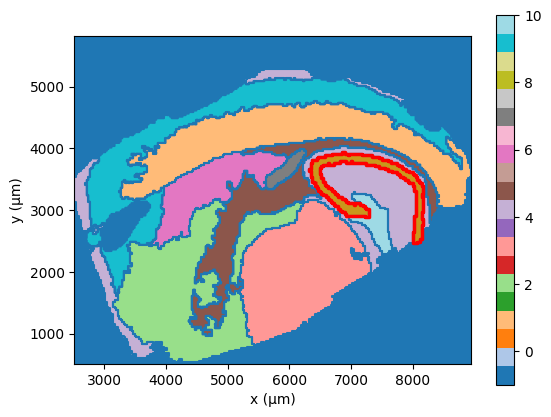

In [23]:
fig, ax = plt.subplots()
_show_grid(grid, geo, ax=ax, cmap="tab20")
_overlay_polygons(
    region,
    ax=ax,
    highlight=(8, None),
    highlight_edge_kw={"color": "red", "linewidth": 2.5},
)

In [24]:
anatom_annot[sample] = {}
anatom_annot[sample]["fiber_tracts"] = []
anatom_annot[sample]["HIP"] = []
anatom_annot[sample]["CAsp"] = []
anatom_annot[sample]["DG-sg"] = []
anatom_annot[sample]["CTX"] = []
anatom_annot[sample]["STR"] = []
anatom_annot[sample]["VS"] = []
anatom_annot[sample]["BS/STR"] = []
anatom_annot[sample]["BS"] = []
anatom_annot[sample]["Meninges"] = []

anatom_annot[sample]["CTX"].append(region[0]["poly"])
anatom_annot[sample]["BS/STR"].append(region[1]["poly"])
anatom_annot[sample]["BS"].append(region[2]["poly"])
anatom_annot[sample]["BS"].append(region[3]["poly"])
anatom_annot[sample]["BS"].append(region[4]["poly"])
anatom_annot[sample]["CTX"].append(region[5]["poly"])
anatom_annot[sample]["CTX"].append(region[6]["poly"])
anatom_annot[sample]["CTX"].append(region[7]["poly"])
anatom_annot[sample]["CTX"].append(region[8]["poly"])
anatom_annot[sample]["CTX"].append(region[9]["poly"])
anatom_annot[sample]["CTX"].append(region[10]["poly"])
anatom_annot[sample]["HIP"].append(region[11]["poly"])
anatom_annot[sample]["CTX"].append(region[12]["poly"])
anatom_annot[sample]["HIP"].append(region[13]["poly"])
anatom_annot[sample]["CTX"].append(region[14]["poly"])
anatom_annot[sample]["fiber_tracts"].append(region[15]["poly"])
anatom_annot[sample]["STR"].append(region[16]["poly"])
anatom_annot[sample]["VS"].append(region[17]["poly"])
anatom_annot[sample]["CAsp"].append(region[18]["poly"])
anatom_annot[sample]["CTX"].append(region[19]["poly"])
anatom_annot[sample]["DG-sg"].append(region[20]["poly"])

In [25]:
sample = "foxf2_s5_r0"
grid = grids[sample]
region = regions[sample]
geo = geos[sample]
region

[{'poly': <POLYGON ((9205.284 3315.938, 9205.284 3340.94, 9230.285 3340.94, 9230.285 3...>,
  'code': 1,
  'value': 1,
  'comp_id': 0},
 {'poly': <POLYGON ((10930.387 3890.978, 10930.387 3915.979, 10930.387 3940.981, 10930...>,
  'code': 2,
  'value': 2,
  'comp_id': 0},
 {'poly': <POLYGON ((10680.372 5366.079, 10705.374 5366.079, 10705.374 5391.081, 10680...>,
  'code': 2,
  'value': 2,
  'comp_id': 1},
 {'poly': <POLYGON ((11155.401 3440.947, 11155.401 3465.948, 11130.399 3465.948, 11130...>,
  'code': 3,
  'value': 3,
  'comp_id': 0},
 {'poly': <POLYGON ((11430.417 5991.122, 11455.419 5991.122, 11455.419 6016.124, 11480...>,
  'code': 4,
  'value': 4,
  'comp_id': 0},
 {'poly': <POLYGON ((8780.258 4165.997, 8780.258 4190.998, 8780.258 4216, 8780.258 424...>,
  'code': 4,
  'value': 4,
  'comp_id': 1},
 {'poly': <POLYGON ((9580.306 6641.167, 9580.306 6666.169, 9555.305 6666.169, 9555.305...>,
  'code': 4,
  'value': 4,
  'comp_id': 2},
 {'poly': <POLYGON ((10355.353 3140.926, 10355.3

<Axes: xlabel='x (µm)', ylabel='y (µm)'>

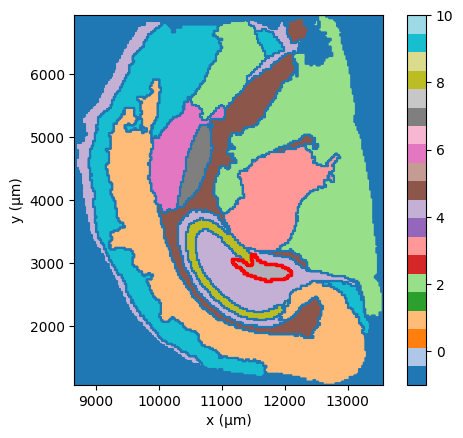

In [26]:
fig, ax = plt.subplots()
_show_grid(grid, geo, ax=ax, cmap="tab20")
_overlay_polygons(
    region,
    ax=ax,
    highlight=(10, None),
    highlight_edge_kw={"color": "red", "linewidth": 2.5},
)

In [27]:
anatom_annot[sample] = {}
anatom_annot[sample]["fiber_tracts"] = []
anatom_annot[sample]["HIP"] = []
anatom_annot[sample]["CAsp"] = []
anatom_annot[sample]["DG-sg"] = []
anatom_annot[sample]["CTX"] = []
anatom_annot[sample]["STR"] = []
anatom_annot[sample]["VS"] = []
anatom_annot[sample]["BS/STR"] = []
anatom_annot[sample]["BS"] = []
anatom_annot[sample]["Meninges"] = []

anatom_annot[sample]["CTX"].append(region[0]["poly"])
anatom_annot[sample]["BS"].append(region[1]["poly"])
anatom_annot[sample]["STR"].append(region[2]["poly"])
anatom_annot[sample]["BS"].append(region[3]["poly"])
anatom_annot[sample]["STR"].append(region[4]["poly"])
anatom_annot[sample]["CTX"].append(region[5]["poly"])
anatom_annot[sample]["CTX"].append(region[6]["poly"])
anatom_annot[sample]["HIP"].append(region[7]["poly"])
anatom_annot[sample]["HIP"].append(region[8]["poly"])
anatom_annot[sample]["STR"].append(region[9]["poly"])
anatom_annot[sample]["fiber_tracts"].append(region[10]["poly"])
anatom_annot[sample]["fiber_tracts"].append(region[11]["poly"])
anatom_annot[sample]["fiber_tracts"].append(region[12]["poly"])
anatom_annot[sample]["STR"].append(region[13]["poly"])
anatom_annot[sample]["VS"].append(region[14]["poly"])
anatom_annot[sample]["CAsp"].append(region[15]["poly"])
anatom_annot[sample]["CTX"].append(region[16]["poly"])
anatom_annot[sample]["STR"].append(region[17]["poly"])
anatom_annot[sample]["CTX"].append(region[18]["poly"])
anatom_annot[sample]["DG-sg"].append(region[19]["poly"])

In [28]:
sample = "foxf2_s5_r1"
grid = grids[sample]
region = regions[sample]
geo = geos[sample]
region

[{'poly': <POLYGON ((3483.781 4033.963, 3483.781 4058.965, 3483.781 4083.966, 3483.781...>,
  'code': 1,
  'value': 1,
  'comp_id': 0},
 {'poly': <POLYGON ((1508.649 608.746, 1508.649 633.747, 1483.648 633.747, 1483.648 65...>,
  'code': 1,
  'value': 1,
  'comp_id': 1},
 {'poly': <POLYGON ((1308.636 783.757, 1308.636 808.758, 1283.634 808.758, 1283.634 78...>,
  'code': 1,
  'value': 1,
  'comp_id': 2},
 {'poly': <POLYGON ((308.569 4333.982, 308.569 4358.984, 283.568 4358.984, 283.568 438...>,
  'code': 2,
  'value': 2,
  'comp_id': 0},
 {'poly': <POLYGON ((3033.751 3908.955, 3008.749 3908.955, 3008.749 3933.957, 3008.749...>,
  'code': 2,
  'value': 2,
  'comp_id': 1},
 {'poly': <POLYGON ((433.578 3133.906, 458.579 3133.906, 458.579 3158.907, 433.578 315...>,
  'code': 2,
  'value': 2,
  'comp_id': 2},
 {'poly': <POLYGON ((258.566 3683.941, 258.566 3708.942, 258.566 3733.944, 233.564 373...>,
  'code': 3,
  'value': 3,
  'comp_id': 0},
 {'poly': <POLYGON ((283.568 3558.933, 283.568 3

<Axes: xlabel='x (µm)', ylabel='y (µm)'>

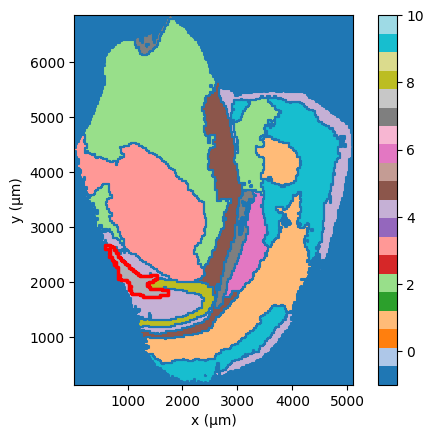

In [29]:
fig, ax = plt.subplots()
_show_grid(grid, geo, ax=ax, cmap="tab20")
_overlay_polygons(
    region,
    ax=ax,
    highlight=(10, None),
    highlight_edge_kw={"color": "red", "linewidth": 2.5},
)

In [30]:
anatom_annot[sample] = {}
anatom_annot[sample]["fiber_tracts"] = []
anatom_annot[sample]["HIP"] = []
anatom_annot[sample]["CAsp"] = []
anatom_annot[sample]["DG-sg"] = []
anatom_annot[sample]["CTX"] = []
anatom_annot[sample]["STR"] = []
anatom_annot[sample]["VS"] = []
anatom_annot[sample]["BS/STR"] = []
anatom_annot[sample]["BS"] = []
anatom_annot[sample]["Meninges"] = []

anatom_annot[sample]["CTX"].append(region[0]["poly"])
anatom_annot[sample]["CTX"].append(region[1]["poly"])
anatom_annot[sample]["CTX"].append(region[2]["poly"])
anatom_annot[sample]["BS"].append(region[3]["poly"])
anatom_annot[sample]["STR"].append(region[4]["poly"])
anatom_annot[sample]["BS"].append(region[5]["poly"])
anatom_annot[sample]["BS"].append(region[6]["poly"])
anatom_annot[sample]["BS"].append(region[7]["poly"])
anatom_annot[sample]["CTX"].append(region[8]["poly"])
anatom_annot[sample]["CTX"].append(region[9]["poly"])
anatom_annot[sample]["HIP"].append(region[10]["poly"])
anatom_annot[sample]["HIP"].append(region[11]["poly"])
anatom_annot[sample]["HIP"].append(region[12]["poly"])
anatom_annot[sample]["CTX"].append(region[13]["poly"])
anatom_annot[sample]["CTX"].append(region[14]["poly"])
anatom_annot[sample]["HIP"].append(region[15]["poly"])
anatom_annot[sample]["HIP"].append(region[16]["poly"])
anatom_annot[sample]["CTX"].append(region[17]["poly"])
anatom_annot[sample]["CTX"].append(region[18]["poly"])
anatom_annot[sample]["CTX"].append(region[19]["poly"])
anatom_annot[sample]["CTX"].append(region[20]["poly"])
anatom_annot[sample]["CTX"].append(region[21]["poly"])
anatom_annot[sample]["fiber_tracts"].append(region[22]["poly"])
anatom_annot[sample]["fiber_tracts"].append(region[23]["poly"])
anatom_annot[sample]["STR"].append(region[24]["poly"])
anatom_annot[sample]["VS"].append(region[25]["poly"])
anatom_annot[sample]["VS"].append(region[26]["poly"])
anatom_annot[sample]["CAsp"].append(region[27]["poly"])
anatom_annot[sample]["CTX"].append(region[28]["poly"])
anatom_annot[sample]["CTX"].append(region[29]["poly"])
anatom_annot[sample]["CTX"].append(region[30]["poly"])
anatom_annot[sample]["DG-sg"].append(region[31]["poly"])

In [31]:
sample = "foxf2_s6_r0"
grid = grids[sample]
region = regions[sample]
geo = geos[sample]
region

[{'poly': <POLYGON ((8111.27 10230.509, 8111.27 10255.511, 8136.272 10255.511, 8161.27...>,
  'code': 1,
  'value': 1,
  'comp_id': 0},
 {'poly': <POLYGON ((8036.265 11605.587, 8036.265 11630.589, 8061.267 11630.589, 8061....>,
  'code': 2,
  'value': 2,
  'comp_id': 0},
 {'poly': <POLYGON ((7961.26 11805.598, 7961.26 11830.6, 7936.258 11830.6, 7936.258 11...>,
  'code': 2,
  'value': 2,
  'comp_id': 1},
 {'poly': <POLYGON ((11436.499 11205.564, 11436.499 11230.566, 11436.499 11255.567, 11...>,
  'code': 2,
  'value': 2,
  'comp_id': 2},
 {'poly': <POLYGON ((8111.27 11455.579, 8111.27 11480.58, 8086.269 11480.58, 8086.269 ...>,
  'code': 2,
  'value': 2,
  'comp_id': 3},
 {'poly': <POLYGON ((8036.265 11430.577, 8036.265 11455.579, 8011.264 11455.579, 8011....>,
  'code': 2,
  'value': 2,
  'comp_id': 4},
 {'poly': <POLYGON ((8136.272 11430.577, 8136.272 11455.579, 8111.27 11455.579, 8111.2...>,
  'code': 2,
  'value': 2,
  'comp_id': 5},
 {'poly': <POLYGON ((8361.288 11430.577, 8361.28

<Axes: xlabel='x (µm)', ylabel='y (µm)'>

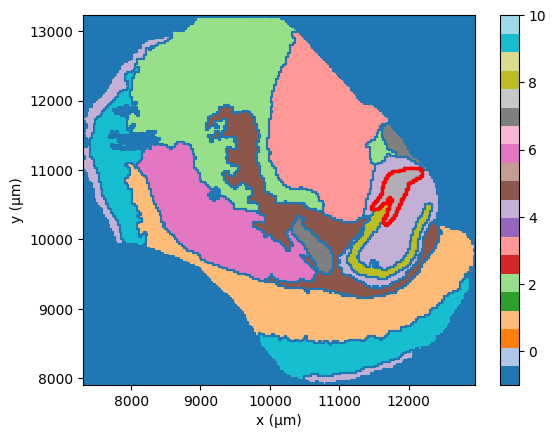

In [32]:
fig, ax = plt.subplots()
_show_grid(grid, geo, ax=ax, cmap="tab20")
_overlay_polygons(
    region,
    ax=ax,
    highlight=(10, None),
    highlight_edge_kw={"color": "red", "linewidth": 2.5},
)

In [33]:
anatom_annot[sample] = {}
anatom_annot[sample]["fiber_tracts"] = []
anatom_annot[sample]["HIP"] = []
anatom_annot[sample]["CAsp"] = []
anatom_annot[sample]["DG-sg"] = []
anatom_annot[sample]["CTX"] = []
anatom_annot[sample]["STR"] = []
anatom_annot[sample]["VS"] = []
anatom_annot[sample]["BS/STR"] = []
anatom_annot[sample]["BS"] = []
anatom_annot[sample]["Meninges"] = []

anatom_annot[sample]["CTX"].append(region[0]["poly"])
anatom_annot[sample]["BS/STR"].append(region[1]["poly"])
anatom_annot[sample]["BS/STR"].append(region[2]["poly"])
anatom_annot[sample]["BS"].append(region[3]["poly"])
anatom_annot[sample]["BS/STR"].append(region[4]["poly"])
anatom_annot[sample]["BS/STR"].append(region[5]["poly"])
anatom_annot[sample]["BS/STR"].append(region[6]["poly"])
anatom_annot[sample]["BS/STR"].append(region[7]["poly"])
anatom_annot[sample]["BS/STR"].append(region[8]["poly"])
anatom_annot[sample]["BS"].append(region[9]["poly"])
anatom_annot[sample]["BS"].append(region[10]["poly"])
anatom_annot[sample]["BS"].append(region[11]["poly"])
anatom_annot[sample]["CTX"].append(region[12]["poly"])
anatom_annot[sample]["CTX"].append(region[13]["poly"])
anatom_annot[sample]["CTX"].append(region[14]["poly"])
anatom_annot[sample]["HIP"].append(region[15]["poly"])
anatom_annot[sample]["CTX"].append(region[16]["poly"])
anatom_annot[sample]["fiber_tracts"].append(region[17]["poly"])
anatom_annot[sample]["STR"].append(region[18]["poly"])
anatom_annot[sample]["VS"].append(region[19]["poly"])
anatom_annot[sample]["VS"].append(region[20]["poly"])
anatom_annot[sample]["CAsp"].append(region[21]["poly"])
anatom_annot[sample]["CTX"].append(region[22]["poly"])
anatom_annot[sample]["CTX"].append(region[23]["poly"])
anatom_annot[sample]["CTX"].append(region[24]["poly"])
anatom_annot[sample]["DG-sg"].append(region[25]["poly"])

In [34]:
sample = "foxf2_s6_r1"
grid = grids[sample]
region = regions[sample]
geo = geos[sample]
region

[{'poly': <POLYGON ((704.406 8222.383, 679.404 8222.383, 654.403 8222.383, 654.403 824...>,
  'code': 1,
  'value': 1,
  'comp_id': 0},
 {'poly': <POLYGON ((3504.576 7472.335, 3479.574 7472.335, 3454.573 7472.335, 3429.571...>,
  'code': 2,
  'value': 2,
  'comp_id': 0},
 {'poly': <POLYGON ((2454.512 6322.262, 2454.512 6347.264, 2429.511 6347.264, 2429.511...>,
  'code': 2,
  'value': 2,
  'comp_id': 1},
 {'poly': <POLYGON ((2529.517 6672.285, 2529.517 6697.286, 2504.515 6697.286, 2504.515...>,
  'code': 3,
  'value': 3,
  'comp_id': 0},
 {'poly': <POLYGON ((229.377 8522.401, 229.377 8547.403, 229.377 8572.405, 254.378 857...>,
  'code': 4,
  'value': 4,
  'comp_id': 0},
 {'poly': <POLYGON ((4329.626 10272.512, 4304.625 10272.512, 4279.623 10272.512, 4279....>,
  'code': 4,
  'value': 4,
  'comp_id': 1},
 {'poly': <POLYGON ((5754.713 9497.463, 5754.713 9522.465, 5729.711 9522.465, 5704.71 ...>,
  'code': 4,
  'value': 4,
  'comp_id': 2},
 {'poly': <POLYGON ((1279.441 7597.343, 1254.439

<Axes: xlabel='x (µm)', ylabel='y (µm)'>

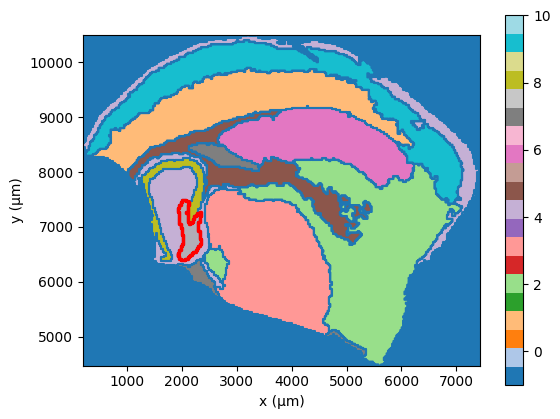

In [35]:
fig, ax = plt.subplots()
_show_grid(grid, geo, ax=ax, cmap="tab20")
_overlay_polygons(
    region,
    ax=ax,
    highlight=(10, None),
    highlight_edge_kw={"color": "red", "linewidth": 2.5},
)

In [36]:
anatom_annot[sample] = {}
anatom_annot[sample]["fiber_tracts"] = []
anatom_annot[sample]["HIP"] = []
anatom_annot[sample]["CAsp"] = []
anatom_annot[sample]["DG-sg"] = []
anatom_annot[sample]["CTX"] = []
anatom_annot[sample]["STR"] = []
anatom_annot[sample]["VS"] = []
anatom_annot[sample]["BS/STR"] = []
anatom_annot[sample]["BS"] = []
anatom_annot[sample]["Meninges"] = []

anatom_annot[sample]["CTX"].append(region[0]["poly"])
anatom_annot[sample]["BS/STR"].append(region[1]["poly"])
anatom_annot[sample]["BS"].append(region[2]["poly"])
anatom_annot[sample]["BS"].append(region[3]["poly"])
anatom_annot[sample]["CTX"].append(region[4]["poly"])
anatom_annot[sample]["CTX"].append(region[5]["poly"])
anatom_annot[sample]["CTX"].append(region[6]["poly"])
anatom_annot[sample]["CTX"].append(region[7]["poly"])
anatom_annot[sample]["HIP"].append(region[8]["poly"])
anatom_annot[sample]["BS"].append(region[9]["poly"])
anatom_annot[sample]["CTX"].append(region[10]["poly"])
anatom_annot[sample]["fiber_tracts"].append(region[11]["poly"])
anatom_annot[sample]["STR"].append(region[12]["poly"])
anatom_annot[sample]["VS"].append(region[13]["poly"])
anatom_annot[sample]["VS"].append(region[14]["poly"])
anatom_annot[sample]["VS"].append(region[15]["poly"])
anatom_annot[sample]["CAsp"].append(region[16]["poly"])
anatom_annot[sample]["CAsp"].append(region[17]["poly"])
anatom_annot[sample]["CAsp"].append(region[18]["poly"])
anatom_annot[sample]["CTX"].append(region[19]["poly"])
anatom_annot[sample]["DG-sg"].append(region[20]["poly"])

In [37]:
sample = "foxf2_s6_r2"
grid = grids[sample]
region = regions[sample]
geo = geos[sample]
region

[{'poly': <POLYGON ((7401.386 1982.185, 7376.384 1982.185, 7376.384 2007.186, 7376.384...>,
  'code': 1,
  'value': 1,
  'comp_id': 0},
 {'poly': <POLYGON ((8726.47 4882.365, 8701.469 4882.365, 8701.469 4907.366, 8701.469 ...>,
  'code': 2,
  'value': 2,
  'comp_id': 0},
 {'poly': <POLYGON ((7651.402 3932.306, 7651.402 3957.307, 7626.4 3957.307, 7626.4 398...>,
  'code': 2,
  'value': 2,
  'comp_id': 1},
 {'poly': <POLYGON ((11276.633 3232.262, 11276.633 3257.264, 11251.631 3257.264, 11251...>,
  'code': 2,
  'value': 2,
  'comp_id': 2},
 {'poly': <POLYGON ((9126.496 2732.231, 9126.496 2757.233, 9126.496 2782.234, 9126.496...>,
  'code': 2,
  'value': 2,
  'comp_id': 3},
 {'poly': <POLYGON ((9351.51 2907.242, 9326.509 2907.242, 9326.509 2932.244, 9326.509 ...>,
  'code': 3,
  'value': 3,
  'comp_id': 0},
 {'poly': <POLYGON ((8476.454 4882.365, 8476.454 4907.366, 8451.453 4907.366, 8451.453...>,
  'code': 4,
  'value': 4,
  'comp_id': 0},
 {'poly': <POLYGON ((10151.561 1532.157, 10151.5

<Axes: xlabel='x (µm)', ylabel='y (µm)'>

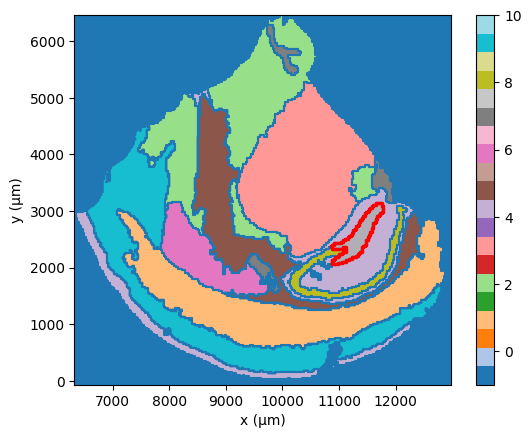

In [38]:
fig, ax = plt.subplots()
_show_grid(grid, geo, ax=ax, cmap="tab20")
_overlay_polygons(
    region,
    ax=ax,
    highlight=(10, None),
    highlight_edge_kw={"color": "red", "linewidth": 2.5},
)

In [39]:
anatom_annot[sample] = {}
anatom_annot[sample]["fiber_tracts"] = []
anatom_annot[sample]["HIP"] = []
anatom_annot[sample]["CAsp"] = []
anatom_annot[sample]["DG-sg"] = []
anatom_annot[sample]["CTX"] = []
anatom_annot[sample]["STR"] = []
anatom_annot[sample]["VS"] = []
anatom_annot[sample]["BS/STR"] = []
anatom_annot[sample]["BS"] = []
anatom_annot[sample]["Meninges"] = []

anatom_annot[sample]["CTX"].append(region[0]["poly"])
anatom_annot[sample]["BS"].append(region[1]["poly"])
anatom_annot[sample]["STR"].append(region[2]["poly"])
anatom_annot[sample]["BS"].append(region[3]["poly"])
anatom_annot[sample]["BS"].append(region[4]["poly"])
anatom_annot[sample]["BS"].append(region[5]["poly"])
anatom_annot[sample]["fiber_tracts"].append(region[6]["poly"])
anatom_annot[sample]["HIP"].append(region[7]["poly"])
anatom_annot[sample]["CTX"].append(region[8]["poly"])
anatom_annot[sample]["HIP"].append(region[9]["poly"])
anatom_annot[sample]["CTX"].append(region[10]["poly"])
anatom_annot[sample]["fiber_tracts"].append(region[11]["poly"])
anatom_annot[sample]["STR"].append(region[12]["poly"])
anatom_annot[sample]["VS"].append(region[13]["poly"])
anatom_annot[sample]["VS"].append(region[14]["poly"])
anatom_annot[sample]["VS"].append(region[15]["poly"])
anatom_annot[sample]["CAsp"].append(region[16]["poly"])
anatom_annot[sample]["CTX"].append(region[17]["poly"])
anatom_annot[sample]["CTX"].append(region[18]["poly"])
anatom_annot[sample]["DG-sg"].append(region[19]["poly"])

In [40]:
sample = "foxf2_s7_r0"
grid = grids[sample]
region = regions[sample]
geo = geos[sample]
region

[{'poly': <POLYGON ((584.806 5159.659, 559.805 5159.659, 559.805 5184.66, 534.803 5184...>,
  'code': 1,
  'value': 1,
  'comp_id': 0},
 {'poly': <POLYGON ((784.819 559.394, 784.819 584.395, 784.819 609.397, 759.817 609.39...>,
  'code': 2,
  'value': 2,
  'comp_id': 0},
 {'poly': <POLYGON ((659.811 3759.578, 659.811 3784.579, 684.812 3784.579, 684.812 380...>,
  'code': 2,
  'value': 2,
  'comp_id': 1},
 {'poly': <POLYGON ((659.811 3784.579, 659.811 3809.581, 634.809 3809.581, 634.809 378...>,
  'code': 2,
  'value': 2,
  'comp_id': 2},
 {'poly': <POLYGON ((2809.944 1234.433, 2784.943 1234.433, 2759.941 1234.433, 2759.941...>,
  'code': 2,
  'value': 2,
  'comp_id': 3},
 {'poly': <POLYGON ((709.814 2609.512, 684.812 2609.512, 684.812 2634.513, 684.812 265...>,
  'code': 3,
  'value': 3,
  'comp_id': 0},
 {'poly': <POLYGON ((359.792 6009.708, 359.792 6034.709, 359.792 6059.71, 384.794 6059...>,
  'code': 4,
  'value': 4,
  'comp_id': 0},
 {'poly': <POLYGON ((1484.862 5459.676, 1509.864

<Axes: xlabel='x (µm)', ylabel='y (µm)'>

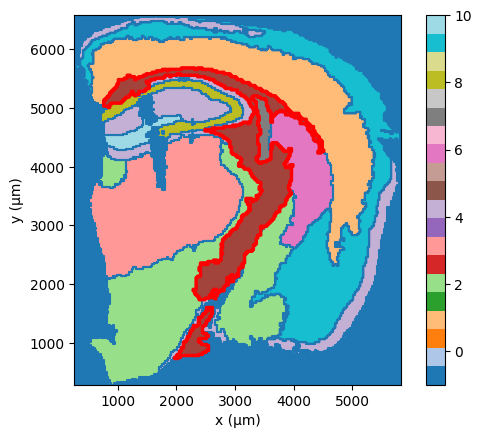

In [41]:
fig, ax = plt.subplots()
_show_grid(grid, geo, ax=ax, cmap="tab20")
_overlay_polygons(
    region,
    ax=ax,
    highlight=(5, None),
    highlight_edge_kw={"color": "red", "linewidth": 2.5},
)

In [42]:
anatom_annot[sample] = {}
anatom_annot[sample]["fiber_tracts"] = []
anatom_annot[sample]["HIP"] = []
anatom_annot[sample]["CAsp"] = []
anatom_annot[sample]["DG-sg"] = []
anatom_annot[sample]["CTX"] = []
anatom_annot[sample]["STR"] = []
anatom_annot[sample]["VS"] = []
anatom_annot[sample]["BS/STR"] = []
anatom_annot[sample]["BS"] = []
anatom_annot[sample]["Meninges"] = []

anatom_annot[sample]["CTX"].append(region[0]["poly"])
anatom_annot[sample]["BS"].append(region[1]["poly"])
anatom_annot[sample]["BS"].append(region[2]["poly"])
anatom_annot[sample]["BS"].append(region[3]["poly"])
anatom_annot[sample]["STR"].append(region[4]["poly"])
anatom_annot[sample]["BS"].append(region[5]["poly"])
anatom_annot[sample]["CTX"].append(region[6]["poly"])
anatom_annot[sample]["HIP"].append(region[7]["poly"])
anatom_annot[sample]["HIP"].append(region[8]["poly"])
anatom_annot[sample]["HIP"].append(region[9]["poly"])
anatom_annot[sample]["HIP"].append(region[10]["poly"])
anatom_annot[sample]["HIP"].append(region[11]["poly"])
anatom_annot[sample]["CTX"].append(region[12]["poly"])
anatom_annot[sample]["fiber_tracts"].append(region[13]["poly"])
anatom_annot[sample]["BS"].append(region[14]["poly"])
anatom_annot[sample]["STR"].append(region[15]["poly"])
anatom_annot[sample]["CTX"].append(region[16]["poly"])
anatom_annot[sample]["CTX"].append(region[17]["poly"])
anatom_annot[sample]["CTX"].append(region[18]["poly"])
anatom_annot[sample]["CTX"].append(region[19]["poly"])
anatom_annot[sample]["fiber_tracts"].append(region[20]["poly"])
anatom_annot[sample]["fiber_tracts"].append(region[21]["poly"])
anatom_annot[sample]["fiber_tracts"].append(region[22]["poly"])
anatom_annot[sample]["fiber_tracts"].append(region[23]["poly"])
anatom_annot[sample]["STR"].append(region[24]["poly"])
anatom_annot[sample]["VS"].append(region[25]["poly"])
anatom_annot[sample]["CAsp"].append(region[26]["poly"])
anatom_annot[sample]["CTX"].append(region[27]["poly"])
anatom_annot[sample]["CTX"].append(region[28]["poly"])
anatom_annot[sample]["HIP"].append(region[29]["poly"])
anatom_annot[sample]["DG-sg"].append(region[30]["poly"])
anatom_annot[sample]["DG-sg"].append(region[31]["poly"])

In [43]:
sample = "foxf2_s7_r1"
grid = grids[sample]
region = regions[sample]
geo = geos[sample]
region

[{'poly': <POLYGON ((5568.691 8699.154, 5568.691 8724.156, 5593.692 8724.156, 5593.692...>,
  'code': 1,
  'value': 1,
  'comp_id': 0},
 {'poly': <POLYGON ((7893.843 10624.282, 7893.843 10649.284, 7893.843 10674.286, 7868....>,
  'code': 2,
  'value': 2,
  'comp_id': 0},
 {'poly': <POLYGON ((7568.821 8649.151, 7543.82 8649.151, 7518.818 8649.151, 7518.818 ...>,
  'code': 2,
  'value': 2,
  'comp_id': 1},
 {'poly': <POLYGON ((9093.921 7524.076, 9093.921 7549.078, 9118.923 7549.078, 9118.923...>,
  'code': 2,
  'value': 2,
  'comp_id': 2},
 {'poly': <POLYGON ((7168.795 9249.191, 7143.793 9249.191, 7143.793 9274.193, 7143.793...>,
  'code': 3,
  'value': 3,
  'comp_id': 0},
 {'poly': <POLYGON ((6343.741 9349.198, 6343.741 9374.199, 6318.74 9374.199, 6318.74 9...>,
  'code': 4,
  'value': 4,
  'comp_id': 0},
 {'poly': <POLYGON ((7343.807 11099.314, 7343.807 11124.316, 7318.805 11124.316, 7318....>,
  'code': 4,
  'value': 4,
  'comp_id': 1},
 {'poly': <POLYGON ((5018.655 9274.193, 5018.655

<Axes: xlabel='x (µm)', ylabel='y (µm)'>

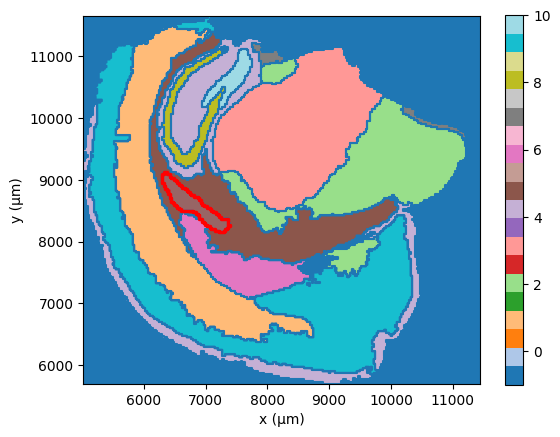

In [44]:
fig, ax = plt.subplots()
_show_grid(grid, geo, ax=ax, cmap="tab20")
_overlay_polygons(
    region,
    ax=ax,
    highlight=(7, 3),
    highlight_edge_kw={"color": "red", "linewidth": 2.5},
)

In [45]:
anatom_annot[sample] = {}
anatom_annot[sample]["fiber_tracts"] = []
anatom_annot[sample]["HIP"] = []
anatom_annot[sample]["CAsp"] = []
anatom_annot[sample]["DG-sg"] = []
anatom_annot[sample]["CTX"] = []
anatom_annot[sample]["STR"] = []
anatom_annot[sample]["VS"] = []
anatom_annot[sample]["BS/STR"] = []
anatom_annot[sample]["BS"] = []
anatom_annot[sample]["Meninges"] = []

anatom_annot[sample]["CTX"].append(region[0]["poly"])
anatom_annot[sample]["BS"].append(region[1]["poly"])
anatom_annot[sample]["BS"].append(region[2]["poly"])
anatom_annot[sample]["STR"].append(region[3]["poly"])
anatom_annot[sample]["BS"].append(region[4]["poly"])
anatom_annot[sample]["HIP"].append(region[5]["poly"])
anatom_annot[sample]["HIP"].append(region[6]["poly"])
anatom_annot[sample]["CTX"].append(region[7]["poly"])
anatom_annot[sample]["CTX"].append(region[8]["poly"])
anatom_annot[sample]["CTX"].append(region[9]["poly"])
anatom_annot[sample]["CTX"].append(region[10]["poly"])
anatom_annot[sample]["CTX"].append(region[11]["poly"])
anatom_annot[sample]["CTX"].append(region[12]["poly"])
anatom_annot[sample]["CTX"].append(region[13]["poly"])
anatom_annot[sample]["CTX"].append(region[14]["poly"])
anatom_annot[sample]["fiber_tracts"].append(region[15]["poly"])
anatom_annot[sample]["fiber_tracts"].append(region[16]["poly"])
anatom_annot[sample]["STR"].append(region[17]["poly"])
anatom_annot[sample]["STR"].append(region[18]["poly"])
anatom_annot[sample]["VS"].append(region[19]["poly"])
anatom_annot[sample]["VS"].append(region[20]["poly"])
anatom_annot[sample]["VS"].append(region[21]["poly"])
anatom_annot[sample]["VS"].append(region[22]["poly"])
anatom_annot[sample]["CAsp"].append(region[23]["poly"])
anatom_annot[sample]["CTX"].append(region[24]["poly"])
anatom_annot[sample]["CTX"].append(region[25]["poly"])
anatom_annot[sample]["DG-sg"].append(region[26]["poly"])

/tmp/ipykernel_2820131/579713673.py:625: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = cm.get_cmap(cmap_name, max(10, len(uniq)))


(<Figure size 800x700 with 1 Axes>,
 <Axes: title={'center': 'Borders — foxf2_s4_r0'}, xlabel='x (µm)', ylabel='y (µm)'>)

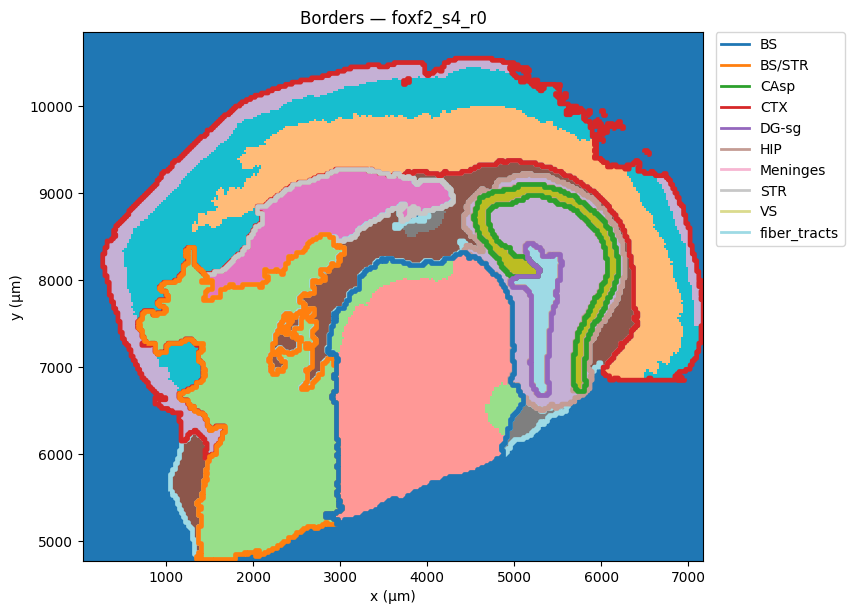

In [54]:
sample = "foxf2_s4_r0"
grid = grids[sample]
geo = geos[sample]
plot_slide_regions(
    regions_by_slide=anatom_annot,
    slide_id=sample,
    label_grid=grid.astype(int),
    geo=geo,  # must match the polygons’ coordinate frame
)

## Mapping

In [59]:
adata_points = sc.read_h5ad(
    "/dss/dsshome1/00/ra87rib/cellseg-benchmark/analysis/foxf2/Cellpose_1_nuclei_model/adatas/adata_integrated.h5ad.gz"
)
adata_points

AnnData object with n_obs × n_vars = 565745 × 500
    obs: 'region', 'slide', 'cell_type_incl_low_quality_revised', 'cell_type_mmc_incl_low_quality_clusters', 'cell_type_mmc_incl_low_quality', 'cell_type_incl_mixed_revised', 'cell_type_mmc_incl_mixed_clusters', 'cell_type_mmc_incl_mixed', 'cell_type_revised', 'cell_type_mmc_raw_clusters', 'cell_type_mmc_raw', 'area', 'volume_sum', 'volume_final', 'num_z_planes', 'size_normalized', 'surface_to_volume_ratio', 'sphericity', 'solidity', 'elongation', 'genotype', 'age_months', 'condition', 'run_date', 'animal_id', 'organism', 'cohort', 'sample', 'n_counts', 'n_genes', 'spatial_outlier', 'low_quality_cell', 'volume_outlier_cell', 'fov'
    var: 'n_cells'
    uns: 'X_umap_20_50', 'X_umap_harmony_20_50', 'cell_type_revised_colors', 'condition_colors', 'neighbors_harmony_20_50', 'neighbors_harmony_20_50_3D', 'pca', 'sample_colors', 'slide_colors'
    obsm: 'Ovrlpy_stats', 'X_pca', 'X_pca_harmony', 'X_umap_20_50', 'X_umap_harmony_20_50', 'fictur

In [98]:
results = map_points_to_regions_from_anndata(
    adata_points,
    regions_by_slide=anatom_annot,
    coord_key="spatial_microns",
    slide_key="sample",
    include_boundary=True,  # boundary-inclusive assignment
    dissolve=False,  # set True if you want to merge touching polys per label first
    index_kind="name",  # return obs_names as indices; use 'pos' for integer positions
    return_df=True,
)

/tmp/ipykernel_2820131/579713673.py:884: FutureWarning: Use obsm (e.g. `k in adata.obsm` or `adata.obsm.keys() | {'u'}`) instead of AnnData.obsm_keys, AnnData.obsm_keys is deprecated and will be removed in the future.
  if coord_key not in adata.obsm_keys():


In [99]:
df_all = pd.concat([v["df"] for v in results.values()], ignore_index=True)
df_all = df_all.set_index("obs_id").reindex(adata_points.obs_names)
adata_points.obs["region_mapped"] = df_all["label"].values
adata_points.obs["region_poly_index"] = df_all["poly_index"].values

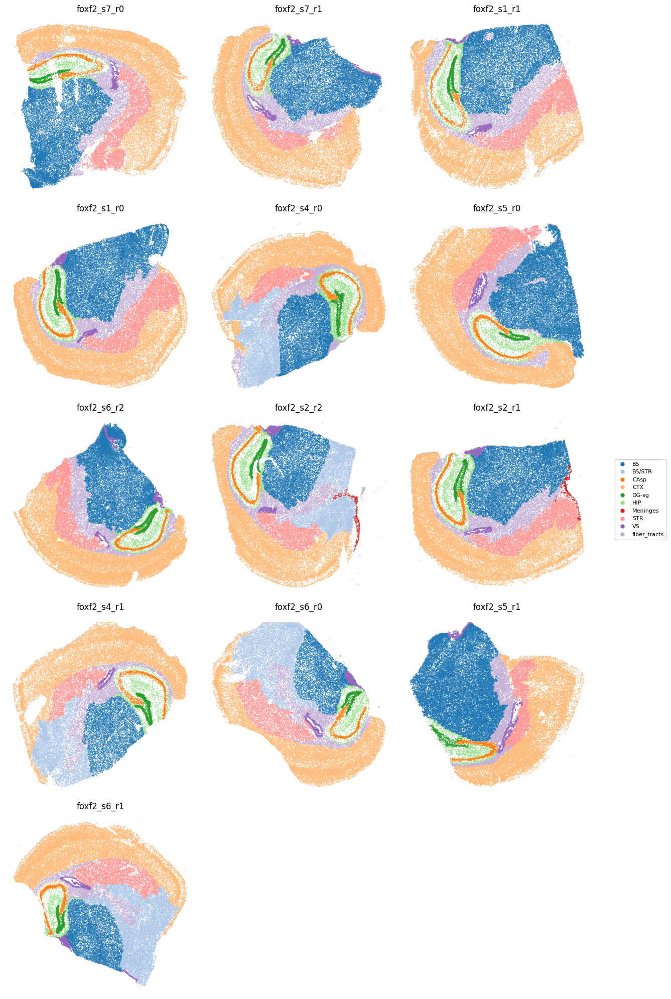

In [101]:
plot_spatial_multiplot(adata_points, "region_mapped")
plt.show()

In [102]:
df_all.to_csv(
    "/dss/dsshome1/00/ra87rib/cellseg-benchmark/analysis/foxf2/Cellpose_1_nuclei_model/spatial_registration.csv"
)

In [46]:
gdf = to_gdf(anatom_annot)
gdf.to_parquet(
    "/dss/dsshome1/00/ra87rib/cellseg-benchmark/misc/brain_regions/foxf2_brain_regions.parquet"
)

# Aging

In [4]:
adata = sc.read_h5ad(
    "/dss/dsshome1/00/ra87rib/cellseg-benchmark/analysis/aging/Negative_Control_Rastered_25/spatial_reg_adata.h5ad"
)
adata

AnnData object with n_obs × n_vars = 571523 × 500
    obs: 'region', 'slide', 'cell_type_incl_low_quality_revised', 'cell_type_mmc_incl_low_quality_clusters', 'cell_type_mmc_incl_low_quality', 'cell_type_incl_mixed_revised', 'cell_type_mmc_incl_mixed_clusters', 'cell_type_mmc_incl_mixed', 'cell_type_revised', 'cell_type_mmc_raw_clusters', 'cell_type_mmc_raw', 'area', 'volume_sum', 'volume_final', 'num_z_planes', 'size_normalized', 'surface_to_volume_ratio', 'sphericity', 'solidity', 'elongation', 'genotype', 'age_months', 'run_date', 'organism', 'cohort', 'sample', 'animal_id', 'condition', 'n_counts', 'n_genes', 'spatial_outlier', 'low_quality_cell', 'volume_outlier_cell', 'fov', 'leiden_res0_25', 'banksy_joined_M0_lam1_k30_res0.2', 'banksy_joined_M0_lam1_k30_res0.4', 'banksy_joined_M0_lam1_k50_res0.2', 'banksy_joined_M0_lam1_k50_res0.4', 'banksy_joined_M0_lam1_k60_res0.2', 'banksy_joined_M0_lam1_k60_res0.4', 'banksy_joined_M0_lam1_k75_res0.2', 'banksy_joined_M0_lam1_k75_res0.4', 'ban

In [5]:
min_hole_area_um2_col = {}
min_island_area_um2_col = {}
for sample in adata.obs["sample"].unique():
    if sample == "foxf2_s1_r1":
        min_hole_area_um2_col[sample] = 10000.0
        min_island_area_um2_col[sample] = 20000.0
    else:
        min_hole_area_um2_col[sample] = 150000.0
        min_island_area_um2_col[sample] = 60000.0

  0%|          | 0/15 [00:00<?, ?it/s]

aging_s11_r0


  7%|▋         | 1/15 [00:03<00:48,  3.45s/it]

aging_s8_r1


 13%|█▎        | 2/15 [00:07<00:49,  3.81s/it]

aging_s5_r1


 20%|██        | 3/15 [00:10<00:43,  3.63s/it]

aging_s10_r0


 27%|██▋       | 4/15 [00:14<00:39,  3.56s/it]

aging_s10_r1


 33%|███▎      | 5/15 [00:17<00:34,  3.48s/it]

aging_s7_r2


 40%|████      | 6/15 [00:20<00:29,  3.30s/it]

aging_s6_r0


 47%|████▋     | 7/15 [00:24<00:27,  3.47s/it]

aging_s11_r1


 53%|█████▎    | 8/15 [00:28<00:24,  3.52s/it]

aging_s12_r0


 60%|██████    | 9/15 [00:31<00:21,  3.56s/it]

aging_s10_r2


 67%|██████▋   | 10/15 [00:35<00:18,  3.74s/it]

aging_s8_r0


 73%|███████▎  | 11/15 [00:39<00:14,  3.74s/it]

aging_s11_r2


 80%|████████  | 12/15 [00:43<00:11,  3.70s/it]

aging_s5_r2


 87%|████████▋ | 13/15 [00:46<00:07,  3.63s/it]

aging_s1_r0


 93%|█████████▎| 14/15 [00:50<00:03,  3.73s/it]

aging_s8_r2


100%|██████████| 15/15 [00:55<00:00,  3.67s/it]


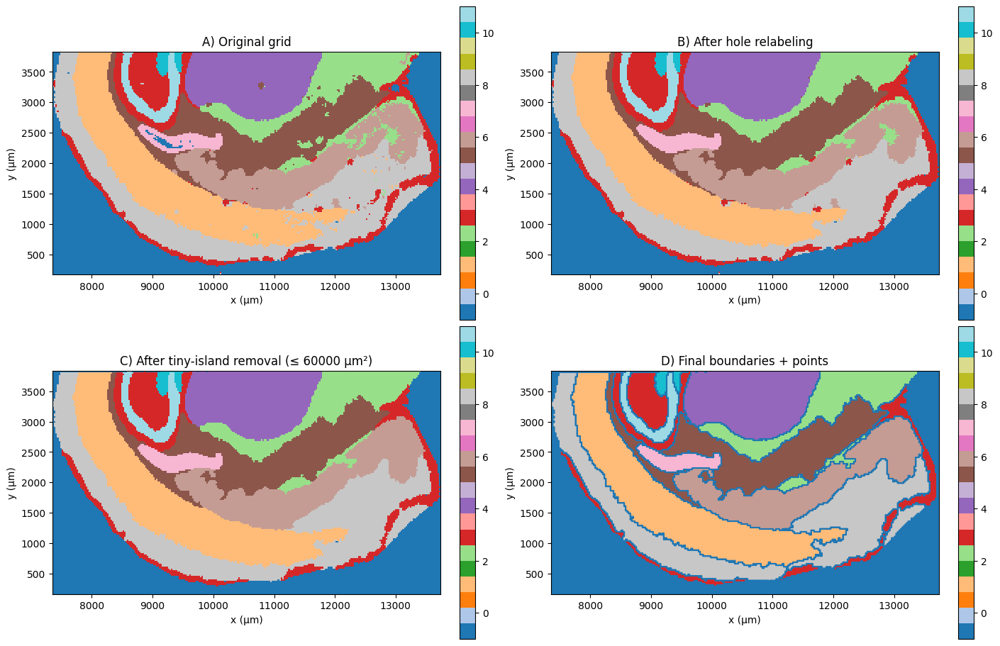

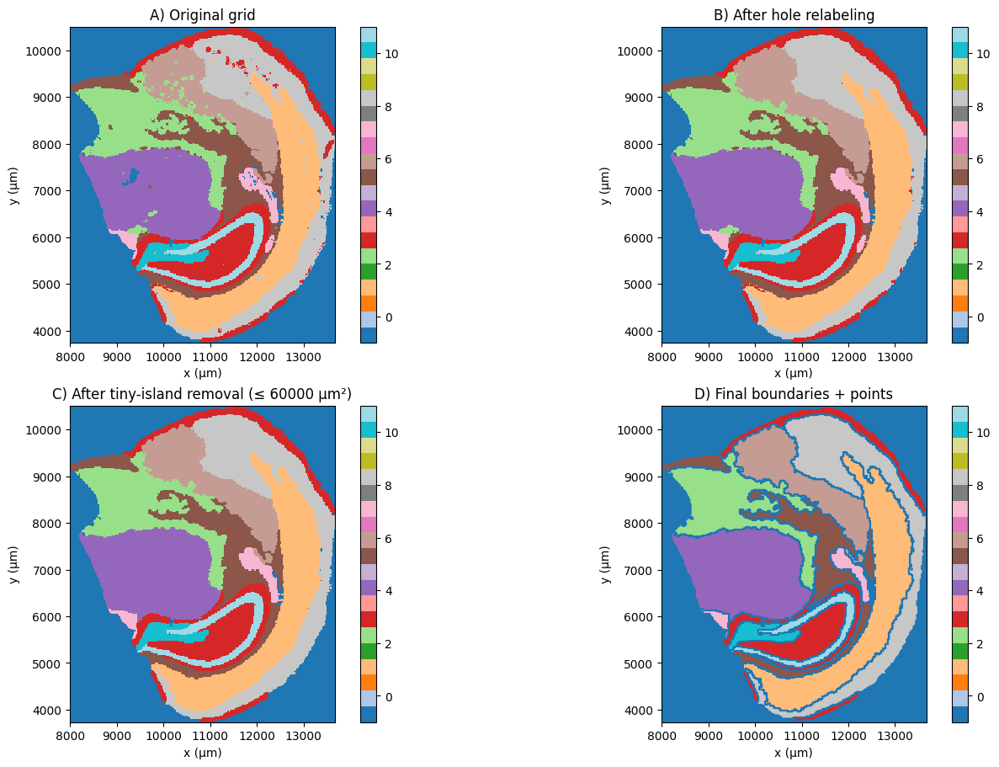

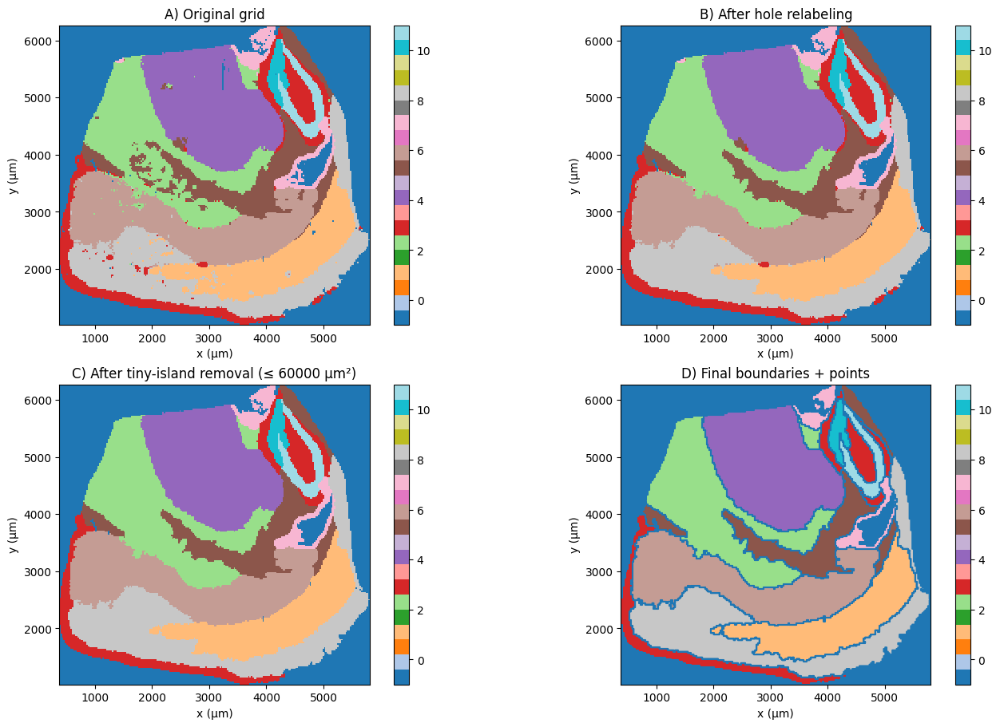

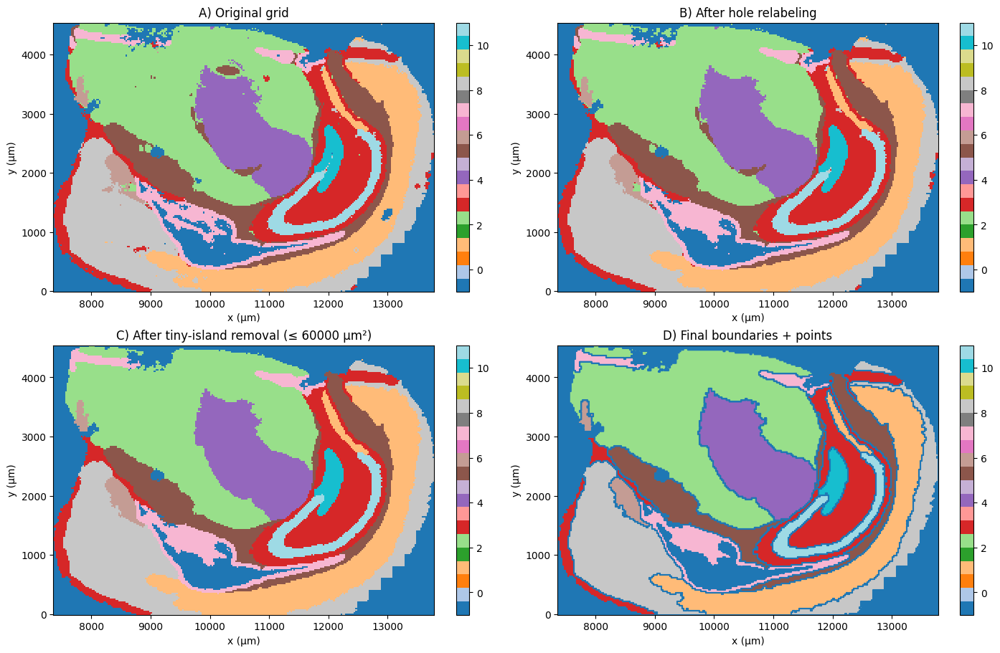

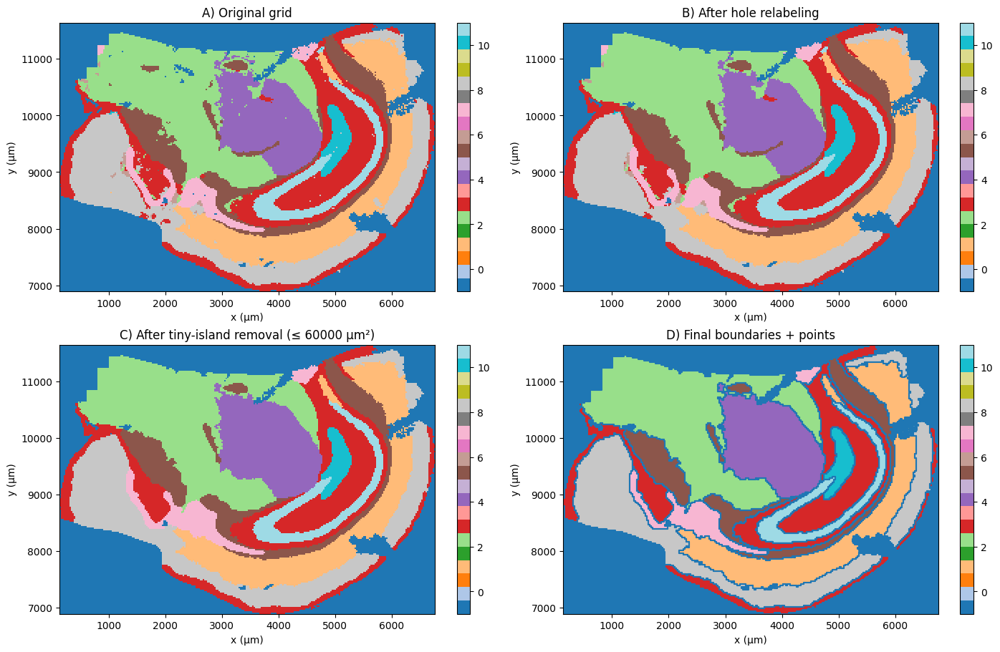

...

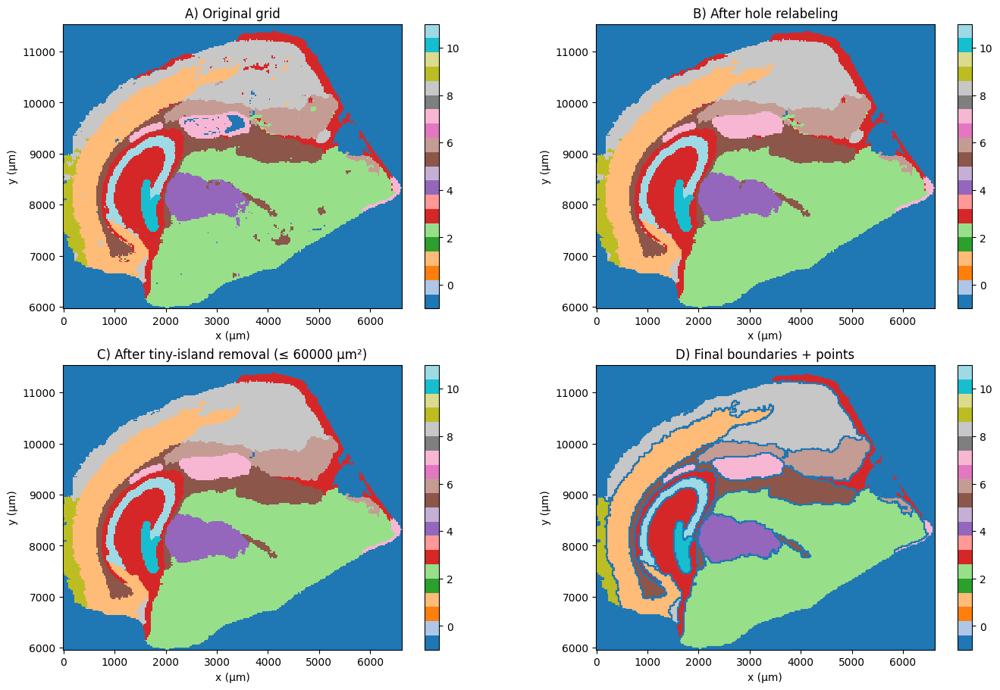

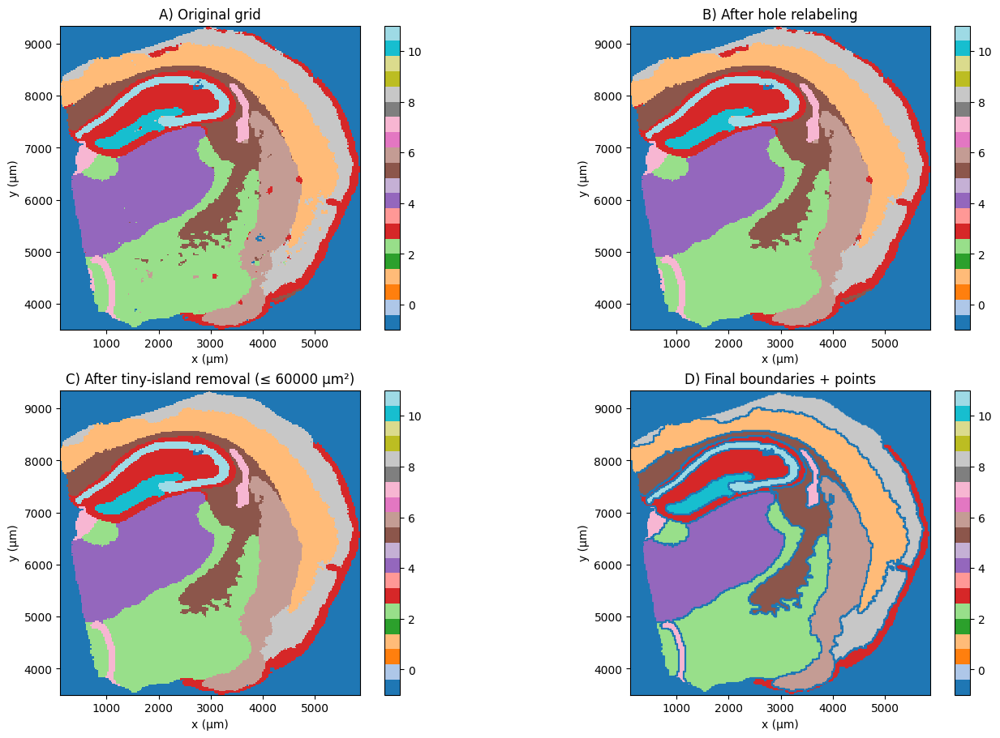

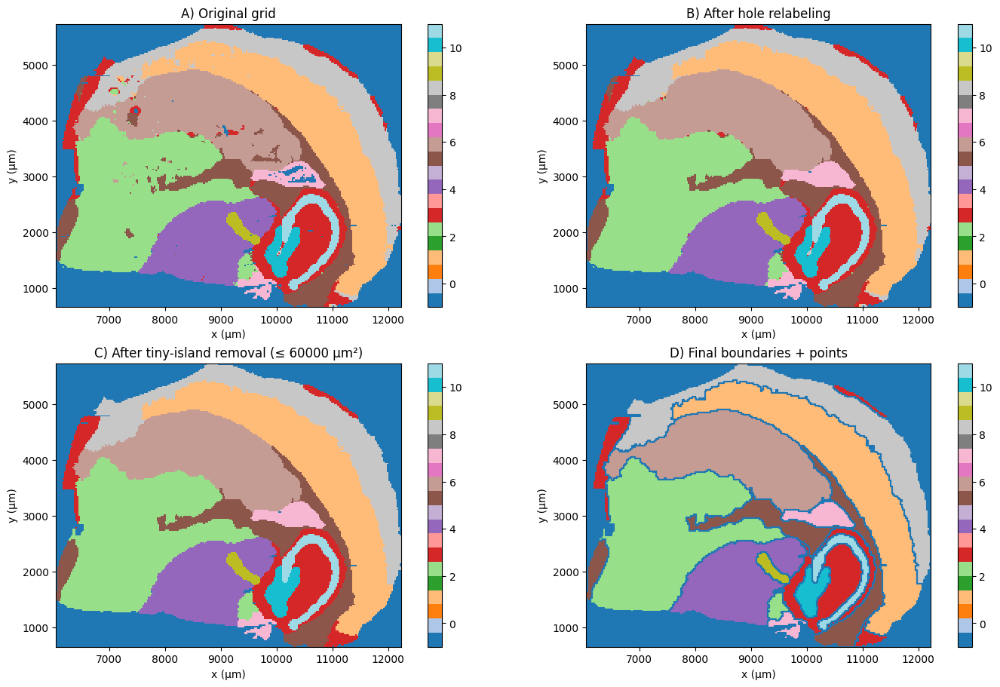

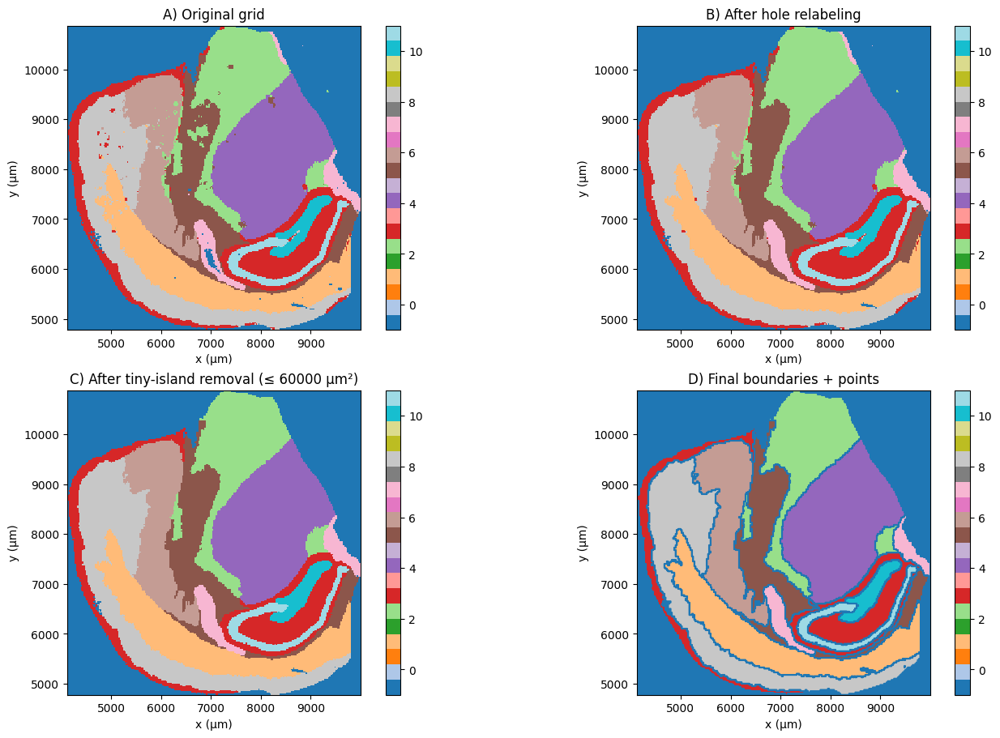

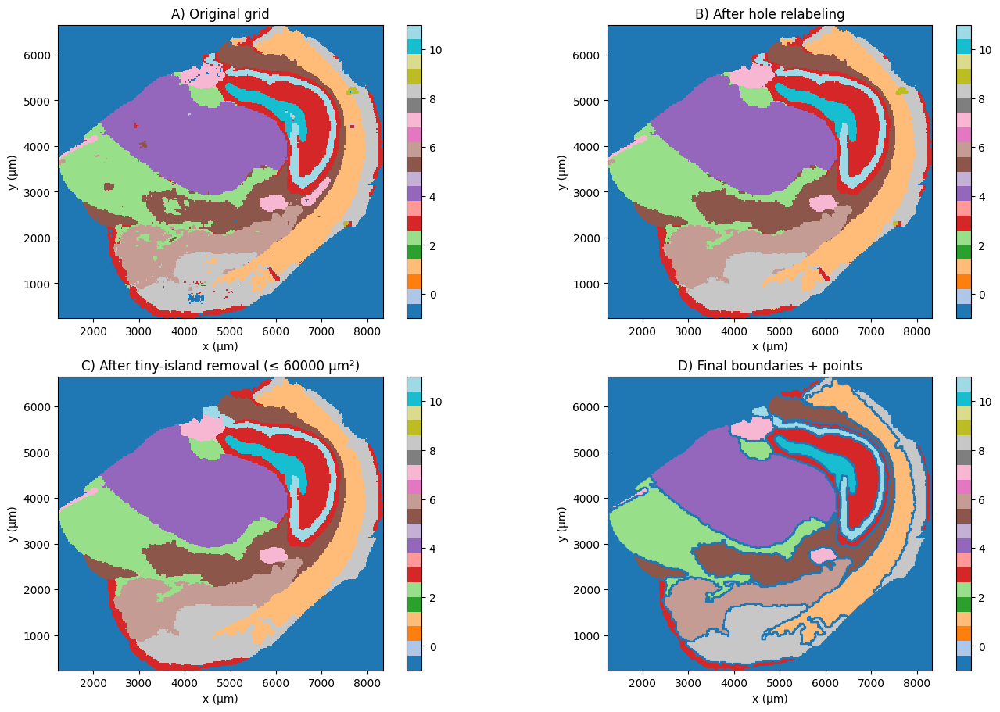

In [6]:
grids = {}
regions = {}
geos = {}

for sample in tqdm(adata.obs["sample"].unique()):
    print(sample)
    _, grid, region, _, geo = plot_progress_pipeline(
        adata,
        sample,
        "banksy_joined_M1_lam1_k60_res0.4",
        relabel_func=relabel_small_holes,
        remove_islands_func=remove_small_islands,
        polygonize_func=polygons_per_component_exact,
        min_hole_area_um2=min_hole_area_um2_col[sample],
        min_island_area_um2=min_island_area_um2_col[sample],
        # save=f"/dss/dsshome1/00/ra87rib/cellseg-benchmark/misc/banksy_tests/postprocessing/{sample}.png"
    )
    grids[sample] = grid
    regions[sample] = region
    geos[sample] = geo

In [7]:
anatom_annot = {}

In [8]:
sample = "aging_s1_r0"
grid = grids[sample]
region = regions[sample]
geo = geos[sample]
region

[{'poly': <POLYGON ((4874.129 7002.545, 4849.128 7002.545, 4849.128 7027.547, 4874.129...>,
  'code': 1,
  'value': 1,
  'comp_id': 0},
 {'poly': <POLYGON ((6674.246 7477.575, 6674.246 7502.577, 6674.246 7527.579, 6699.248...>,
  'code': 2,
  'value': 2,
  'comp_id': 0},
 {'poly': <POLYGON ((6249.218 7927.604, 6249.218 7952.606, 6249.218 7977.607, 6249.218...>,
  'code': 2,
  'value': 2,
  'comp_id': 1},
 {'poly': <POLYGON ((8924.392 7652.586, 8924.392 7677.588, 8899.39 7677.588, 8899.39 7...>,
  'code': 2,
  'value': 2,
  'comp_id': 2},
 {'poly': <POLYGON ((4249.089 7927.604, 4224.087 7927.604, 4224.087 7952.606, 4224.087...>,
  'code': 3,
  'value': 3,
  'comp_id': 0},
 {'poly': <POLYGON ((6474.233 10027.737, 6474.233 10052.739, 6499.235 10052.739, 6524....>,
  'code': 3,
  'value': 3,
  'comp_id': 1},
 {'poly': <POLYGON ((7324.288 5852.472, 7299.286 5852.472, 7299.286 5877.474, 7274.285...>,
  'code': 3,
  'value': 3,
  'comp_id': 2},
 {'poly': <POLYGON ((4724.12 6552.517, 4699.118 

<Axes: xlabel='x (µm)', ylabel='y (µm)'>

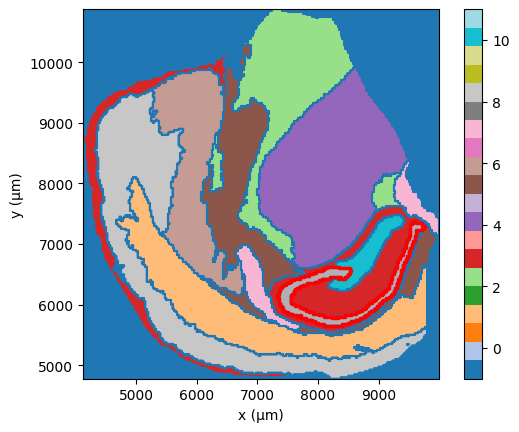

In [9]:
fig, ax = plt.subplots()
_show_grid(grid, geo, ax=ax, cmap="tab20")
_overlay_polygons(
    region,
    ax=ax,
    highlight=(11, None),
    highlight_edge_kw={"color": "red", "linewidth": 2.5},
)

In [10]:
anatom_annot[sample] = {}
anatom_annot[sample]["fiber_tracts"] = []
anatom_annot[sample]["HIP"] = []
anatom_annot[sample]["CAsp"] = []
anatom_annot[sample]["DG-sg"] = []
anatom_annot[sample]["CTX"] = []
anatom_annot[sample]["STR"] = []
anatom_annot[sample]["VS"] = []
anatom_annot[sample]["BS/STR"] = []
anatom_annot[sample]["BS"] = []
anatom_annot[sample]["Meninges"] = []

anatom_annot[sample]["CTX"].append(region[0]["poly"])
anatom_annot[sample]["BS"].append(region[1]["poly"])
anatom_annot[sample]["STR"].append(region[2]["poly"])
anatom_annot[sample]["BS"].append(region[3]["poly"])
anatom_annot[sample]["CTX"].append(region[4]["poly"])
anatom_annot[sample]["CTX"].append(region[5]["poly"])
anatom_annot[sample]["HIP"].append(region[6]["poly"])
anatom_annot[sample]["CTX"].append(region[7]["poly"])
anatom_annot[sample]["BS"].append(region[8]["poly"])
anatom_annot[sample]["fiber_tracts"].append(region[9]["poly"])
anatom_annot[sample]["fiber_tracts"].append(region[10]["poly"])
anatom_annot[sample]["fiber_tracts"].append(region[11]["poly"])
anatom_annot[sample]["STR"].append(region[12]["poly"])
anatom_annot[sample]["VS"].append(region[13]["poly"])
anatom_annot[sample]["VS"].append(region[14]["poly"])
anatom_annot[sample]["CTX"].append(region[15]["poly"])
anatom_annot[sample]["DG-sg"].append(region[16]["poly"])
anatom_annot[sample]["CAsp"].append(region[17]["poly"])

In [11]:
sample = "aging_s5_r1"
grid = grids[sample]
region = regions[sample]
geo = geos[sample]
region

[{'poly': <POLYGON ((2380.2 1816.696, 2380.2 1791.694, 2355.198 1791.694, 2355.198 181...>,
  'code': 1,
  'value': 1,
  'comp_id': 0},
 {'poly': <POLYGON ((930.104 4116.826, 905.102 4116.826, 905.102 4141.827, 880.1 4141....>,
  'code': 2,
  'value': 2,
  'comp_id': 0},
 {'poly': <POLYGON ((3580.28 5366.896, 3555.278 5366.896, 3555.278 5391.898, 3555.278 ...>,
  'code': 2,
  'value': 2,
  'comp_id': 1},
 {'poly': <POLYGON ((3855.298 5166.885, 3855.298 5191.887, 3855.298 5216.888, 3855.298...>,
  'code': 3,
  'value': 3,
  'comp_id': 0},
 {'poly': <POLYGON ((4430.336 4991.875, 4405.335 4991.875, 4405.335 5016.877, 4380.333...>,
  'code': 3,
  'value': 3,
  'comp_id': 1},
 {'poly': <POLYGON ((4705.355 5441.901, 4680.353 5441.901, 4680.353 5466.902, 4655.351...>,
  'code': 3,
  'value': 3,
  'comp_id': 2},
 {'poly': <POLYGON ((4680.353 4241.833, 4655.351 4241.833, 4655.351 4266.834, 4630.35 ...>,
  'code': 3,
  'value': 3,
  'comp_id': 3},
 {'poly': <POLYGON ((430.07 1891.7, 430.07 1916.

<Axes: xlabel='x (µm)', ylabel='y (µm)'>

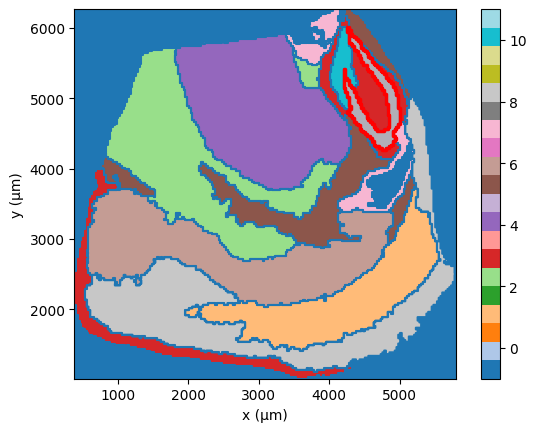

In [12]:
fig, ax = plt.subplots()
_show_grid(grid, geo, ax=ax, cmap="tab20")
_overlay_polygons(
    region,
    ax=ax,
    highlight=(11, None),
    highlight_edge_kw={"color": "red", "linewidth": 2.5},
)

In [13]:
anatom_annot[sample] = {}
anatom_annot[sample]["fiber_tracts"] = []
anatom_annot[sample]["HIP"] = []
anatom_annot[sample]["CAsp"] = []
anatom_annot[sample]["DG-sg"] = []
anatom_annot[sample]["CTX"] = []
anatom_annot[sample]["STR"] = []
anatom_annot[sample]["VS"] = []
anatom_annot[sample]["BS/STR"] = []
anatom_annot[sample]["BS"] = []
anatom_annot[sample]["Meninges"] = []

anatom_annot[sample]["CTX"].append(region[0]["poly"])
anatom_annot[sample]["BS/STR"].append(region[1]["poly"])
anatom_annot[sample]["BS"].append(region[2]["poly"])
anatom_annot[sample]["HIP"].append(region[3]["poly"])
anatom_annot[sample]["HIP"].append(region[4]["poly"])
anatom_annot[sample]["HIP"].append(region[5]["poly"])
anatom_annot[sample]["HIP"].append(region[6]["poly"])
anatom_annot[sample]["CTX"].append(region[7]["poly"])
anatom_annot[sample]["BS"].append(region[8]["poly"])
anatom_annot[sample]["CTX"].append(region[9]["poly"])
anatom_annot[sample]["fiber_tracts"].append(region[10]["poly"])
anatom_annot[sample]["fiber_tracts"].append(region[11]["poly"])
anatom_annot[sample]["fiber_tracts"].append(region[12]["poly"])
anatom_annot[sample]["STR"].append(region[13]["poly"])
anatom_annot[sample]["VS"].append(region[14]["poly"])
anatom_annot[sample]["VS"].append(region[15]["poly"])
anatom_annot[sample]["VS"].append(region[16]["poly"])
anatom_annot[sample]["VS"].append(region[17]["poly"])
anatom_annot[sample]["CTX"].append(region[18]["poly"])
anatom_annot[sample]["DG-sg"].append(region[19]["poly"])
anatom_annot[sample]["CAsp"].append(region[20]["poly"])

In [14]:
sample = "aging_s5_r2"
grid = grids[sample]
region = regions[sample]
geo = geos[sample]
region

[{'poly': <POLYGON ((7600.511 4931.076, 7600.511 4956.078, 7625.513 4956.078, 7625.513...>,
  'code': 1,
  'value': 1,
  'comp_id': 0},
 {'poly': <POLYGON ((6225.418 1380.849, 6225.418 1405.85, 6200.416 1405.85, 6200.416 1...>,
  'code': 2,
  'value': 2,
  'comp_id': 0},
 {'poly': <POLYGON ((9300.626 1205.838, 9300.626 1230.839, 9300.626 1255.841, 9300.626...>,
  'code': 2,
  'value': 2,
  'comp_id': 1},
 {'poly': <POLYGON ((10550.711 5256.097, 10525.709 5256.097, 10500.708 5256.097, 10500...>,
  'code': 3,
  'value': 3,
  'comp_id': 0},
 {'poly': <POLYGON ((6175.415 3555.988, 6175.415 3580.99, 6175.415 3605.991, 6175.415 ...>,
  'code': 3,
  'value': 3,
  'comp_id': 1},
 {'poly': <POLYGON ((6425.431 2780.938, 6425.431 2805.94, 6400.43 2805.94, 6400.43 278...>,
  'code': 3,
  'value': 3,
  'comp_id': 2},
 {'poly': <POLYGON ((10425.702 1080.83, 10450.704 1080.83, 10450.704 1105.831, 10475.7...>,
  'code': 3,
  'value': 3,
  'comp_id': 3},
 {'poly': <POLYGON ((9650.65 1380.849, 9625.648 

<Axes: xlabel='x (µm)', ylabel='y (µm)'>

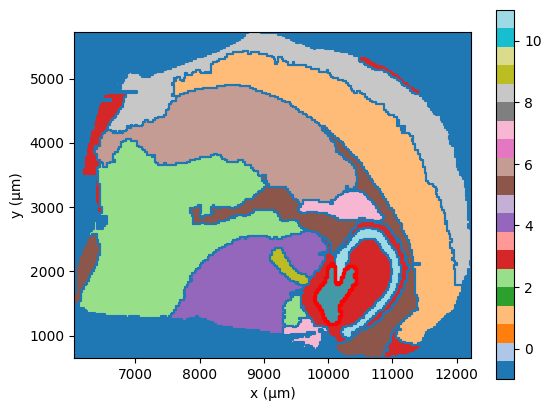

In [15]:
fig, ax = plt.subplots()
_show_grid(grid, geo, ax=ax, cmap="tab20")
_overlay_polygons(
    region,
    ax=ax,
    highlight=(10, None),
    highlight_edge_kw={"color": "red", "linewidth": 2.5},
)

In [16]:
anatom_annot[sample] = {}
anatom_annot[sample]["fiber_tracts"] = []
anatom_annot[sample]["HIP"] = []
anatom_annot[sample]["CAsp"] = []
anatom_annot[sample]["DG-sg"] = []
anatom_annot[sample]["CTX"] = []
anatom_annot[sample]["STR"] = []
anatom_annot[sample]["VS"] = []
anatom_annot[sample]["BS/STR"] = []
anatom_annot[sample]["BS"] = []
anatom_annot[sample]["Meninges"] = []

anatom_annot[sample]["CTX"].append(region[0]["poly"])
anatom_annot[sample]["BS/STR"].append(region[1]["poly"])
anatom_annot[sample]["BS"].append(region[2]["poly"])
anatom_annot[sample]["CTX"].append(region[3]["poly"])
anatom_annot[sample]["Meninges"].append(region[4]["poly"])
anatom_annot[sample]["Meninges"].append(region[5]["poly"])
anatom_annot[sample]["HIP"].append(region[6]["poly"])
anatom_annot[sample]["HIP"].append(region[7]["poly"])
anatom_annot[sample]["CTX"].append(region[8]["poly"])
anatom_annot[sample]["BS"].append(region[9]["poly"])
anatom_annot[sample]["fiber_tracts"].append(region[10]["poly"])
anatom_annot[sample]["fiber_tracts"].append(region[11]["poly"])
anatom_annot[sample]["BS"].append(region[12]["poly"])
anatom_annot[sample]["STR"].append(region[13]["poly"])
anatom_annot[sample]["VS"].append(region[14]["poly"])
anatom_annot[sample]["VS"].append(region[15]["poly"])
anatom_annot[sample]["CTX"].append(region[16]["poly"])
anatom_annot[sample]["BS"].append(region[17]["poly"])
anatom_annot[sample]["DG-sg"].append(region[18]["poly"])
anatom_annot[sample]["CAsp"].append(region[19]["poly"])

In [17]:
sample = "aging_s6_r0"
grid = grids[sample]
region = regions[sample]
geo = geos[sample]
region

[{'poly': <POLYGON ((4268.781 11035.423, 4268.781 11060.424, 4293.782 11060.424, 4293....>,
  'code': 1,
  'value': 1,
  'comp_id': 0},
 {'poly': <POLYGON ((6593.914 12160.501, 6593.914 12185.503, 6568.913 12185.503, 6568....>,
  'code': 1,
  'value': 1,
  'comp_id': 1},
 {'poly': <POLYGON ((6568.913 12110.498, 6543.911 12110.498, 6543.911 12135.5, 6543.91...>,
  'code': 1,
  'value': 1,
  'comp_id': 2},
 {'poly': <POLYGON ((6743.923 6835.129, 6743.923 6860.13, 6743.923 6885.132, 6718.921 ...>,
  'code': 2,
  'value': 2,
  'comp_id': 0},
 {'poly': <POLYGON ((8469.022 9210.295, 8469.022 9235.297, 8494.023 9235.297, 8494.023...>,
  'code': 2,
  'value': 2,
  'comp_id': 1},
 {'poly': <POLYGON ((5668.861 9310.302, 5668.861 9335.304, 5693.863 9335.304, 5693.863...>,
  'code': 2,
  'value': 2,
  'comp_id': 2},
 {'poly': <POLYGON ((4943.82 9860.34, 4918.818 9860.34, 4918.818 9885.342, 4918.818 99...>,
  'code': 3,
  'value': 3,
  'comp_id': 0},
 {'poly': <POLYGON ((4043.768 10860.41, 4018.767

<Axes: xlabel='x (µm)', ylabel='y (µm)'>

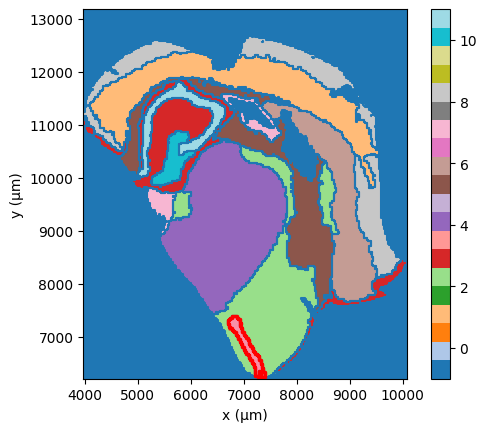

In [18]:
fig, ax = plt.subplots()
_show_grid(grid, geo, ax=ax, cmap="tab20")
_overlay_polygons(
    region,
    ax=ax,
    highlight=(7, 2),
    highlight_edge_kw={"color": "red", "linewidth": 2.5},
)

In [19]:
anatom_annot[sample] = {}
anatom_annot[sample]["fiber_tracts"] = []
anatom_annot[sample]["HIP"] = []
anatom_annot[sample]["CAsp"] = []
anatom_annot[sample]["DG-sg"] = []
anatom_annot[sample]["CTX"] = []
anatom_annot[sample]["STR"] = []
anatom_annot[sample]["VS"] = []
anatom_annot[sample]["BS/STR"] = []
anatom_annot[sample]["BS"] = []
anatom_annot[sample]["Meninges"] = []

anatom_annot[sample]["CTX"].append(region[0]["poly"])
anatom_annot[sample]["CTX"].append(region[1]["poly"])
anatom_annot[sample]["CTX"].append(region[2]["poly"])
anatom_annot[sample]["BS"].append(region[3]["poly"])
anatom_annot[sample]["STR"].append(region[4]["poly"])
anatom_annot[sample]["BS"].append(region[5]["poly"])
anatom_annot[sample]["HIP"].append(region[6]["poly"])
anatom_annot[sample]["CTX"].append(region[7]["poly"])
anatom_annot[sample]["HIP"].append(region[8]["poly"])
anatom_annot[sample]["HIP"].append(region[9]["poly"])
anatom_annot[sample]["Meninges"].append(region[10]["poly"])
anatom_annot[sample]["Meninges"].append(region[11]["poly"])
anatom_annot[sample]["Meninges"].append(region[12]["poly"])
anatom_annot[sample]["BS"].append(region[13]["poly"])
anatom_annot[sample]["fiber_tracts"].append(region[14]["poly"])
anatom_annot[sample]["fiber_tracts"].append(region[15]["poly"])
anatom_annot[sample]["fiber_tracts"].append(region[16]["poly"])
anatom_annot[sample]["fiber_tracts"].append(region[17]["poly"])
anatom_annot[sample]["fiber_tracts"].append(region[18]["poly"])
anatom_annot[sample]["fiber_tracts"].append(region[19]["poly"])
anatom_annot[sample]["fiber_tracts"].append(region[20]["poly"])
anatom_annot[sample]["fiber_tracts"].append(region[21]["poly"])
anatom_annot[sample]["fiber_tracts"].append(region[22]["poly"])
anatom_annot[sample]["fiber_tracts"].append(region[23]["poly"])
anatom_annot[sample]["fiber_tracts"].append(region[24]["poly"])
anatom_annot[sample]["fiber_tracts"].append(region[25]["poly"])
anatom_annot[sample]["fiber_tracts"].append(region[26]["poly"])
anatom_annot[sample]["fiber_tracts"].append(region[27]["poly"])
anatom_annot[sample]["fiber_tracts"].append(region[28]["poly"])
anatom_annot[sample]["fiber_tracts"].append(region[29]["poly"])
anatom_annot[sample]["fiber_tracts"].append(region[30]["poly"])
anatom_annot[sample]["fiber_tracts"].append(region[31]["poly"])
anatom_annot[sample]["CTX"].append(region[32]["poly"])
anatom_annot[sample]["CTX"].append(region[33]["poly"])
anatom_annot[sample]["CTX"].append(region[34]["poly"])
anatom_annot[sample]["VS"].append(region[35]["poly"])
anatom_annot[sample]["VS"].append(region[36]["poly"])
anatom_annot[sample]["VS"].append(region[37]["poly"])
anatom_annot[sample]["CTX"].append(region[38]["poly"])
anatom_annot[sample]["CTX"].append(region[39]["poly"])
anatom_annot[sample]["CTX"].append(region[40]["poly"])
anatom_annot[sample]["CTX"].append(region[41]["poly"])
anatom_annot[sample]["CTX"].append(region[42]["poly"])
anatom_annot[sample]["CTX"].append(region[43]["poly"])
anatom_annot[sample]["DG-sg"].append(region[44]["poly"])
anatom_annot[sample]["CAsp"].append(region[45]["poly"])

In [20]:
sample = "aging_s7_r2"
grid = grids[sample]
region = regions[sample]
geo = geos[sample]
region

[{'poly': <POLYGON ((6422.337 3497.52, 6422.337 3522.521, 6397.335 3522.521, 6397.335 ...>,
  'code': 1,
  'value': 1,
  'comp_id': 0},
 {'poly': <POLYGON ((10597.568 122.328, 10622.57 122.328, 10647.571 122.328, 10647.571...>,
  'code': 1,
  'value': 1,
  'comp_id': 1},
 {'poly': <POLYGON ((10847.582 147.329, 10847.582 172.331, 10822.581 172.331, 10822.58...>,
  'code': 1,
  'value': 1,
  'comp_id': 2},
 {'poly': <POLYGON ((5897.308 2172.445, 5922.309 2172.445, 5922.309 2197.446, 5897.308...>,
  'code': 2,
  'value': 2,
  'comp_id': 0},
 {'poly': <POLYGON ((7247.383 4322.567, 7247.383 4297.566, 7272.384 4297.566, 7297.385...>,
  'code': 3,
  'value': 3,
  'comp_id': 0},
 {'poly': <POLYGON ((6272.328 3197.503, 6247.327 3197.503, 6247.327 3222.504, 6222.326...>,
  'code': 3,
  'value': 3,
  'comp_id': 1},
 {'poly': <POLYGON ((11222.603 872.371, 11222.603 897.372, 11222.603 922.373, 11222.60...>,
  'code': 3,
  'value': 3,
  'comp_id': 2},
 {'poly': <POLYGON ((7997.424 1197.389, 7997.424

<Axes: xlabel='x (µm)', ylabel='y (µm)'>

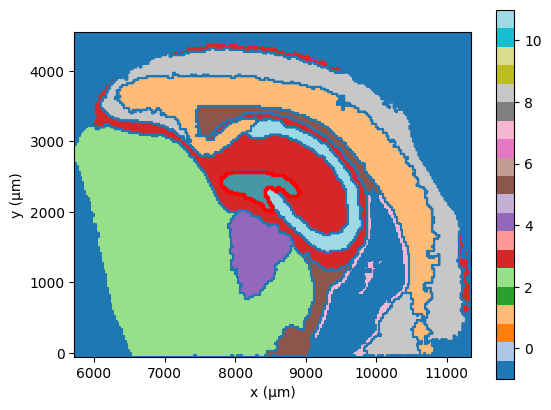

In [21]:
fig, ax = plt.subplots()
_show_grid(grid, geo, ax=ax, cmap="tab20")
_overlay_polygons(
    region,
    ax=ax,
    highlight=(10, None),
    highlight_edge_kw={"color": "red", "linewidth": 2.5},
)

In [22]:
anatom_annot[sample] = {}
anatom_annot[sample]["fiber_tracts"] = []
anatom_annot[sample]["HIP"] = []
anatom_annot[sample]["CAsp"] = []
anatom_annot[sample]["DG-sg"] = []
anatom_annot[sample]["CTX"] = []
anatom_annot[sample]["STR"] = []
anatom_annot[sample]["VS"] = []
anatom_annot[sample]["BS/STR"] = []
anatom_annot[sample]["BS"] = []
anatom_annot[sample]["Meninges"] = []

anatom_annot[sample]["CTX"].append(region[0]["poly"])
anatom_annot[sample]["CTX"].append(region[1]["poly"])
anatom_annot[sample]["CTX"].append(region[2]["poly"])
anatom_annot[sample]["BS"].append(region[3]["poly"])
anatom_annot[sample]["CTX"].append(region[4]["poly"])
anatom_annot[sample]["HIP"].append(region[5]["poly"])
anatom_annot[sample]["CTX"].append(region[6]["poly"])
anatom_annot[sample]["BS"].append(region[7]["poly"])
anatom_annot[sample]["fiber_tracts"].append(region[8]["poly"])
anatom_annot[sample]["fiber_tracts"].append(region[9]["poly"])
anatom_annot[sample]["VS"].append(region[10]["poly"])
anatom_annot[sample]["VS"].append(region[11]["poly"])
anatom_annot[sample]["VS"].append(region[12]["poly"])
anatom_annot[sample]["VS"].append(region[13]["poly"])
anatom_annot[sample]["VS"].append(region[14]["poly"])
anatom_annot[sample]["VS"].append(region[15]["poly"])
anatom_annot[sample]["VS"].append(region[16]["poly"])
anatom_annot[sample]["CTX"].append(region[17]["poly"])
anatom_annot[sample]["CTX"].append(region[18]["poly"])
anatom_annot[sample]["CTX"].append(region[19]["poly"])
anatom_annot[sample]["DG-sg"].append(region[20]["poly"])
anatom_annot[sample]["CAsp"].append(region[21]["poly"])

In [23]:
sample = "aging_s8_r0"
grid = grids[sample]
region = regions[sample]
geo = geos[sample]
region

[{'poly': <POLYGON ((290.977 7638.13, 265.975 7638.13, 265.975 7663.132, 240.973 7663....>,
  'code': 1,
  'value': 1,
  'comp_id': 0},
 {'poly': <POLYGON ((1716.075 6038.025, 1691.074 6038.025, 1691.074 6063.027, 1666.072...>,
  'code': 2,
  'value': 2,
  'comp_id': 0},
 {'poly': <POLYGON ((3391.191 11213.364, 3416.193 11213.364, 3416.193 11238.366, 3416....>,
  'code': 3,
  'value': 3,
  'comp_id': 0},
 {'poly': <POLYGON ((5666.349 9613.26, 5666.349 9638.261, 5641.347 9638.261, 5641.347 ...>,
  'code': 3,
  'value': 3,
  'comp_id': 1},
 {'poly': <POLYGON ((5691.35 9588.258, 5691.35 9613.26, 5666.349 9613.26, 5666.349 958...>,
  'code': 3,
  'value': 3,
  'comp_id': 2},
 {'poly': <POLYGON ((791.011 7713.135, 791.011 7738.137, 766.01 7738.137, 766.01 7763....>,
  'code': 3,
  'value': 3,
  'comp_id': 3},
 {'poly': <POLYGON ((5866.362 9013.22, 5841.361 9013.22, 5841.361 9038.222, 5841.361 9...>,
  'code': 3,
  'value': 3,
  'comp_id': 4},
 {'poly': <POLYGON ((5916.366 9063.223, 5916.366

<Axes: xlabel='x (µm)', ylabel='y (µm)'>

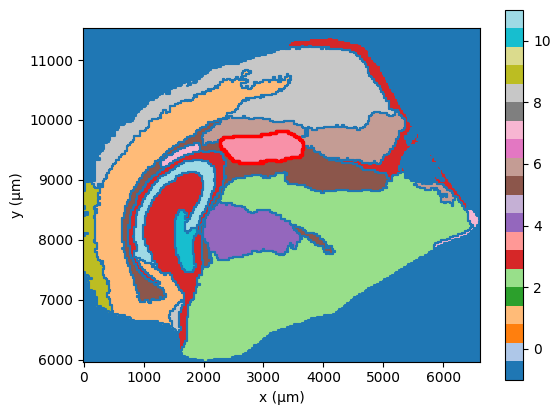

In [24]:
fig, ax = plt.subplots()
_show_grid(grid, geo, ax=ax, cmap="tab20")
_overlay_polygons(
    region,
    ax=ax,
    highlight=(7, 0),
    highlight_edge_kw={"color": "red", "linewidth": 2.5},
)

In [25]:
anatom_annot[sample] = {}
anatom_annot[sample]["fiber_tracts"] = []
anatom_annot[sample]["HIP"] = []
anatom_annot[sample]["CAsp"] = []
anatom_annot[sample]["DG-sg"] = []
anatom_annot[sample]["CTX"] = []
anatom_annot[sample]["STR"] = []
anatom_annot[sample]["VS"] = []
anatom_annot[sample]["BS/STR"] = []
anatom_annot[sample]["BS"] = []
anatom_annot[sample]["Meninges"] = []

anatom_annot[sample]["CTX"].append(region[0]["poly"])
anatom_annot[sample]["BS"].append(region[1]["poly"])
anatom_annot[sample]["Meninges"].append(region[2]["poly"])
anatom_annot[sample]["Meninges"].append(region[3]["poly"])
anatom_annot[sample]["Meninges"].append(region[4]["poly"])
anatom_annot[sample]["HIP"].append(region[5]["poly"])
anatom_annot[sample]["Meninges"].append(region[6]["poly"])
anatom_annot[sample]["Meninges"].append(region[7]["poly"])
anatom_annot[sample]["BS"].append(region[8]["poly"])
anatom_annot[sample]["fiber_tracts"].append(region[9]["poly"])
anatom_annot[sample]["fiber_tracts"].append(region[10]["poly"])
anatom_annot[sample]["fiber_tracts"].append(region[11]["poly"])
anatom_annot[sample]["STR"].append(region[12]["poly"])
anatom_annot[sample]["STR"].append(region[13]["poly"])
anatom_annot[sample]["VS"].append(region[14]["poly"])
anatom_annot[sample]["fiber_tracts"].append(region[15]["poly"])
anatom_annot[sample]["BS"].append(region[16]["poly"])
anatom_annot[sample]["CTX"].append(region[17]["poly"])
anatom_annot[sample]["CTX"].append(region[18]["poly"])
anatom_annot[sample]["CTX"].append(region[19]["poly"])
anatom_annot[sample]["DG-sg"].append(region[20]["poly"])
anatom_annot[sample]["CAsp"].append(region[21]["poly"])

In [26]:
sample = "aging_s8_r1"
grid = grids[sample]
region = regions[sample]
geo = geos[sample]
region

[{'poly': <POLYGON ((10246.841 4233.023, 10246.841 4258.025, 10246.841 4283.027, 10246...>,
  'code': 1,
  'value': 1,
  'comp_id': 0},
 {'poly': <POLYGON ((8271.704 7833.276, 8271.704 7858.278, 8296.706 7858.278, 8296.706...>,
  'code': 2,
  'value': 2,
  'comp_id': 0},
 {'poly': <POLYGON ((9196.768 9458.39, 9171.767 9458.39, 9146.765 9458.39, 9146.765 94...>,
  'code': 3,
  'value': 3,
  'comp_id': 0},
 {'poly': <POLYGON ((10346.848 4983.076, 10346.848 5008.078, 10321.846 5008.078, 10296...>,
  'code': 3,
  'value': 3,
  'comp_id': 1},
 {'poly': <POLYGON ((9971.822 5283.097, 9971.822 5308.099, 9946.82 5308.099, 9921.819 ...>,
  'code': 3,
  'value': 3,
  'comp_id': 2},
 {'poly': <POLYGON ((9321.777 5383.104, 9321.777 5408.106, 9321.777 5433.108, 9321.777...>,
  'code': 3,
  'value': 3,
  'comp_id': 3},
 {'poly': <POLYGON ((9771.808 4683.055, 9771.808 4708.057, 9746.807 4708.057, 9746.807...>,
  'code': 3,
  'value': 3,
  'comp_id': 4},
 {'poly': <POLYGON ((10821.881 3732.988, 10821.8

<Axes: xlabel='x (µm)', ylabel='y (µm)'>

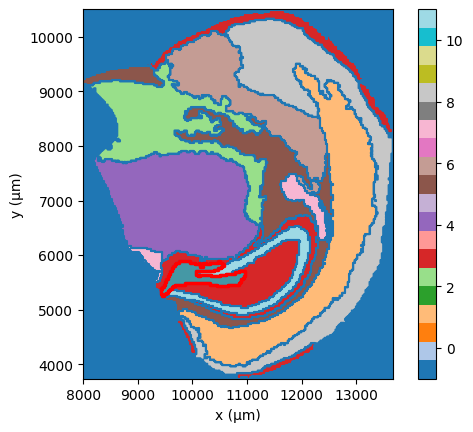

In [27]:
fig, ax = plt.subplots()
_show_grid(grid, geo, ax=ax, cmap="tab20")
_overlay_polygons(
    region,
    ax=ax,
    highlight=(10, None),
    highlight_edge_kw={"color": "red", "linewidth": 2.5},
)

In [28]:
anatom_annot[sample] = {}
anatom_annot[sample]["fiber_tracts"] = []
anatom_annot[sample]["HIP"] = []
anatom_annot[sample]["CAsp"] = []
anatom_annot[sample]["DG-sg"] = []
anatom_annot[sample]["CTX"] = []
anatom_annot[sample]["STR"] = []
anatom_annot[sample]["VS"] = []
anatom_annot[sample]["BS/STR"] = []
anatom_annot[sample]["BS"] = []
anatom_annot[sample]["Meninges"] = []

anatom_annot[sample]["CTX"].append(region[0]["poly"])
anatom_annot[sample]["BS/STR"].append(region[1]["poly"])
anatom_annot[sample]["Meninges"].append(region[2]["poly"])
anatom_annot[sample]["HIP"].append(region[3]["poly"])
anatom_annot[sample]["HIP"].append(region[4]["poly"])
anatom_annot[sample]["HIP"].append(region[5]["poly"])
anatom_annot[sample]["CTX"].append(region[6]["poly"])
anatom_annot[sample]["CTX"].append(region[7]["poly"])
anatom_annot[sample]["BS"].append(region[8]["poly"])
anatom_annot[sample]["fiber_tracts"].append(region[9]["poly"])
anatom_annot[sample]["fiber_tracts"].append(region[10]["poly"])
anatom_annot[sample]["fiber_tracts"].append(region[11]["poly"])
anatom_annot[sample]["STR"].append(region[12]["poly"])
anatom_annot[sample]["STR"].append(region[13]["poly"])
anatom_annot[sample]["VS"].append(region[14]["poly"])
anatom_annot[sample]["VS"].append(region[15]["poly"])
anatom_annot[sample]["CTX"].append(region[16]["poly"])
anatom_annot[sample]["DG-sg"].append(region[17]["poly"])
anatom_annot[sample]["CAsp"].append(region[18]["poly"])

In [29]:
sample = "aging_s8_r2"
grid = grids[sample]
region = regions[sample]
geo = geos[sample]
region

[{'poly': <POLYGON ((4710.678 1079.914, 4710.678 1104.915, 4735.68 1104.915, 4735.68 1...>,
  'code': 1,
  'value': 1,
  'comp_id': 0},
 {'poly': <POLYGON ((4135.64 5105.19, 4135.64 5130.191, 4135.64 5155.193, 4135.64 5180...>,
  'code': 2,
  'value': 2,
  'comp_id': 0},
 {'poly': <POLYGON ((1435.461 3155.056, 1410.459 3155.056, 1410.459 3180.058, 1385.457...>,
  'code': 2,
  'value': 2,
  'comp_id': 1},
 {'poly': <POLYGON ((5035.7 6255.268, 5010.698 6255.268, 5010.698 6280.27, 4985.696 62...>,
  'code': 3,
  'value': 3,
  'comp_id': 0},
 {'poly': <POLYGON ((4910.691 4980.181, 4885.69 4980.181, 4860.688 4980.181, 4860.688 ...>,
  'code': 3,
  'value': 3,
  'comp_id': 1},
 {'poly': <POLYGON ((8110.904 3355.07, 8110.904 3380.071, 8135.906 3380.071, 8135.906 ...>,
  'code': 3,
  'value': 3,
  'comp_id': 2},
 {'poly': <POLYGON ((2410.525 1529.944, 2410.525 1554.946, 2385.524 1554.946, 2385.524...>,
  'code': 3,
  'value': 3,
  'comp_id': 3},
 {'poly': <POLYGON ((2435.527 4155.124, 2435.527

<Axes: xlabel='x (µm)', ylabel='y (µm)'>

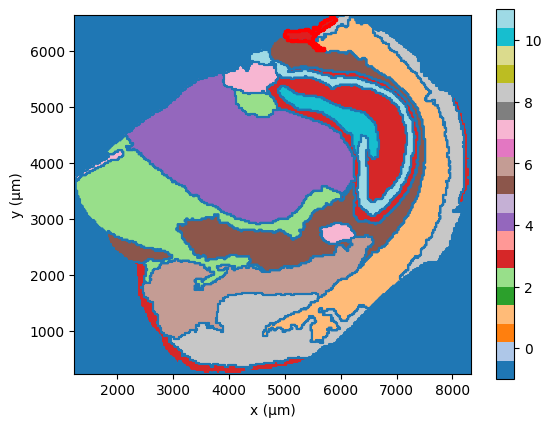

In [30]:
fig, ax = plt.subplots()
_show_grid(grid, geo, ax=ax, cmap="tab20")
_overlay_polygons(
    region,
    ax=ax,
    highlight=(3, 0),
    highlight_edge_kw={"color": "red", "linewidth": 2.5},
)

In [31]:
anatom_annot[sample] = {}
anatom_annot[sample]["fiber_tracts"] = []
anatom_annot[sample]["HIP"] = []
anatom_annot[sample]["CAsp"] = []
anatom_annot[sample]["DG-sg"] = []
anatom_annot[sample]["CTX"] = []
anatom_annot[sample]["STR"] = []
anatom_annot[sample]["VS"] = []
anatom_annot[sample]["BS/STR"] = []
anatom_annot[sample]["BS"] = []
anatom_annot[sample]["Meninges"] = []

anatom_annot[sample]["CTX"].append(region[0]["poly"])
anatom_annot[sample]["BS"].append(region[1]["poly"])
anatom_annot[sample]["BS/STR"].append(region[2]["poly"])
anatom_annot[sample]["CTX"].append(region[3]["poly"])
anatom_annot[sample]["HIP"].append(region[4]["poly"])
anatom_annot[sample]["Meninges"].append(region[5]["poly"])
anatom_annot[sample]["Meninges"].append(region[6]["poly"])
anatom_annot[sample]["BS"].append(region[7]["poly"])
anatom_annot[sample]["fiber_tracts"].append(region[8]["poly"])
anatom_annot[sample]["fiber_tracts"].append(region[9]["poly"])
anatom_annot[sample]["STR"].append(region[10]["poly"])
anatom_annot[sample]["VS"].append(region[11]["poly"])
anatom_annot[sample]["VS"].append(region[12]["poly"])
anatom_annot[sample]["VS"].append(region[13]["poly"])
anatom_annot[sample]["CTX"].append(region[14]["poly"])
anatom_annot[sample]["CTX"].append(region[15]["poly"])
anatom_annot[sample]["CTX"].append(region[16]["poly"])
anatom_annot[sample]["CTX"].append(region[17]["poly"])
anatom_annot[sample]["CTX"].append(region[18]["poly"])
anatom_annot[sample]["DG-sg"].append(region[19]["poly"])
anatom_annot[sample]["CAsp"].append(region[20]["poly"])

In [32]:
sample = "aging_s10_r0"
grid = grids[sample]
region = regions[sample]
geo = geos[sample]
region

[{'poly': <POLYGON ((12582.843 4287.478, 12582.843 4312.48, 12557.841 4312.48, 12557.8...>,
  'code': 1,
  'value': 1,
  'comp_id': 0},
 {'poly': <POLYGON ((9407.657 137.212, 9407.657 162.213, 9382.655 162.213, 9382.655 18...>,
  'code': 1,
  'value': 1,
  'comp_id': 1},
 {'poly': <POLYGON ((12007.809 3362.419, 11982.807 3362.419, 11982.807 3387.42, 11982....>,
  'code': 1,
  'value': 1,
  'comp_id': 2},
 {'poly': <POLYGON ((7932.57 4387.484, 7907.569 4387.484, 7882.567 4387.484, 7882.567 ...>,
  'code': 2,
  'value': 2,
  'comp_id': 0},
 {'poly': <POLYGON ((7607.551 3487.427, 7607.551 3512.428, 7607.551 3537.43, 7582.55 3...>,
  'code': 2,
  'value': 2,
  'comp_id': 1},
 {'poly': <POLYGON ((10832.74 4387.484, 10832.74 4412.486, 10807.739 4412.486, 10807.7...>,
  'code': 2,
  'value': 2,
  'comp_id': 2},
 {'poly': <POLYGON ((8057.577 3087.401, 8057.577 3112.403, 8032.576 3112.403, 8032.576...>,
  'code': 2,
  'value': 2,
  'comp_id': 3},
 {'poly': <POLYGON ((12257.824 3762.444, 12257.8

<Axes: xlabel='x (µm)', ylabel='y (µm)'>

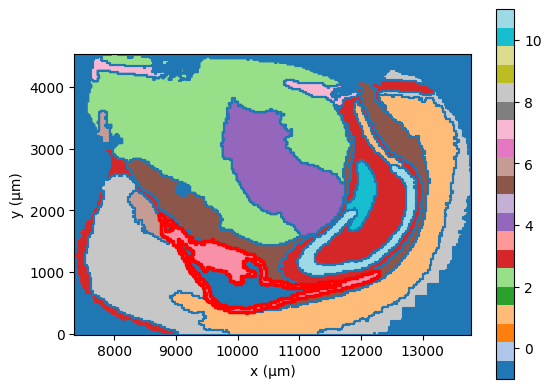

In [33]:
fig, ax = plt.subplots()
_show_grid(grid, geo, ax=ax, cmap="tab20")
_overlay_polygons(
    region,
    ax=ax,
    highlight=(7, 3),
    highlight_edge_kw={"color": "red", "linewidth": 2.5},
)

In [34]:
anatom_annot[sample] = {}
anatom_annot[sample]["fiber_tracts"] = []
anatom_annot[sample]["HIP"] = []
anatom_annot[sample]["CAsp"] = []
anatom_annot[sample]["DG-sg"] = []
anatom_annot[sample]["CTX"] = []
anatom_annot[sample]["STR"] = []
anatom_annot[sample]["VS"] = []
anatom_annot[sample]["BS/STR"] = []
anatom_annot[sample]["BS"] = []
anatom_annot[sample]["Meninges"] = []

anatom_annot[sample]["CAsp"].append(region[0]["poly"])
anatom_annot[sample]["CTX"].append(region[1]["poly"])
anatom_annot[sample]["BS"].append(region[2]["poly"])
anatom_annot[sample]["BS"].append(region[3]["poly"])
anatom_annot[sample]["BS"].append(region[4]["poly"])
anatom_annot[sample]["BS"].append(region[5]["poly"])
anatom_annot[sample]["BS"].append(region[6]["poly"])
anatom_annot[sample]["CTX"].append(region[7]["poly"])
anatom_annot[sample]["HIP"].append(region[8]["poly"])
anatom_annot[sample]["fiber_tracts"].append(region[9]["poly"])
anatom_annot[sample]["fiber_tracts"].append(region[10]["poly"])
anatom_annot[sample]["CTX"].append(region[11]["poly"])
anatom_annot[sample]["BS"].append(region[12]["poly"])
anatom_annot[sample]["fiber_tracts"].append(region[13]["poly"])
anatom_annot[sample]["fiber_tracts"].append(region[14]["poly"])
anatom_annot[sample]["fiber_tracts"].append(region[15]["poly"])
anatom_annot[sample]["fiber_tracts"].append(region[16]["poly"])
anatom_annot[sample]["BS"].append(region[17]["poly"])
anatom_annot[sample]["STR"].append(region[18]["poly"])
anatom_annot[sample]["VS"].append(region[19]["poly"])
anatom_annot[sample]["VS"].append(region[20]["poly"])
anatom_annot[sample]["VS"].append(region[21]["poly"])
anatom_annot[sample]["VS"].append(region[22]["poly"])
anatom_annot[sample]["VS"].append(region[23]["poly"])
anatom_annot[sample]["VS"].append(region[24]["poly"])
anatom_annot[sample]["CTX"].append(region[25]["poly"])
anatom_annot[sample]["CTX"].append(region[26]["poly"])
anatom_annot[sample]["CTX"].append(region[27]["poly"])
anatom_annot[sample]["DG-sg"].append(region[28]["poly"])
anatom_annot[sample]["CAsp"].append(region[29]["poly"])

In [35]:
sample = "aging_s10_r1"
grid = grids[sample]
region = regions[sample]
geo = geos[sample]
region

[{'poly': <POLYGON ((5387.808 10940.037, 5362.807 10940.037, 5362.807 10965.039, 5337....>,
  'code': 1,
  'value': 1,
  'comp_id': 0},
 {'poly': <POLYGON ((4787.765 10815.029, 4787.765 10840.031, 4762.763 10840.031, 4762....>,
  'code': 1,
  'value': 1,
  'comp_id': 1},
 {'poly': <POLYGON ((6037.855 10214.988, 6037.855 10239.99, 6012.854 10239.99, 6012.85...>,
  'code': 1,
  'value': 1,
  'comp_id': 2},
 {'poly': <POLYGON ((6212.868 10189.986, 6212.868 10214.988, 6187.866 10214.988, 6187....>,
  'code': 1,
  'value': 1,
  'comp_id': 3},
 {'poly': <POLYGON ((6212.868 10139.983, 6212.868 10164.985, 6212.868 10189.986, 6237....>,
  'code': 1,
  'value': 1,
  'comp_id': 4},
 {'poly': <POLYGON ((6187.866 10114.981, 6162.864 10114.981, 6162.864 10139.983, 6162....>,
  'code': 1,
  'value': 1,
  'comp_id': 5},
 {'poly': <POLYGON ((6112.861 10089.98, 6112.861 10114.981, 6112.861 10139.983, 6137.8...>,
  'code': 1,
  'value': 1,
  'comp_id': 6},
 {'poly': <POLYGON ((6087.859 10089.98, 6087.859

<Axes: xlabel='x (µm)', ylabel='y (µm)'>

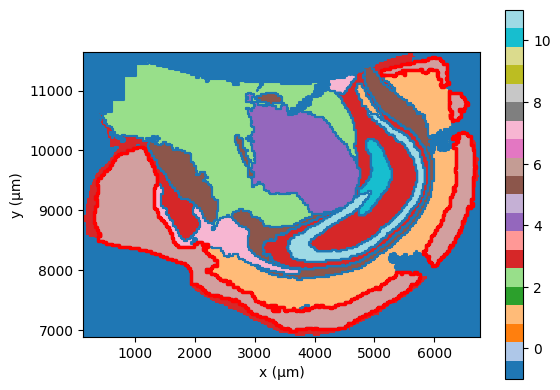

In [36]:
fig, ax = plt.subplots()
_show_grid(grid, geo, ax=ax, cmap="tab20")
_overlay_polygons(
    region,
    ax=ax,
    highlight=(8, None),
    highlight_edge_kw={"color": "red", "linewidth": 2.5},
)

In [37]:
anatom_annot[sample] = {}
anatom_annot[sample]["fiber_tracts"] = []
anatom_annot[sample]["HIP"] = []
anatom_annot[sample]["CAsp"] = []
anatom_annot[sample]["DG-sg"] = []
anatom_annot[sample]["CTX"] = []
anatom_annot[sample]["STR"] = []
anatom_annot[sample]["VS"] = []
anatom_annot[sample]["BS/STR"] = []
anatom_annot[sample]["BS"] = []
anatom_annot[sample]["Meninges"] = []
anatom_annot[sample]["STR/CTX"] = []

anatom_annot[sample]["CTX"].append(region[0]["poly"])
anatom_annot[sample]["HIP"].append(region[1]["poly"])
anatom_annot[sample]["CTX"].append(region[2]["poly"])
anatom_annot[sample]["CTX"].append(region[3]["poly"])
anatom_annot[sample]["CTX"].append(region[4]["poly"])
anatom_annot[sample]["CTX"].append(region[5]["poly"])
anatom_annot[sample]["CTX"].append(region[6]["poly"])
anatom_annot[sample]["CTX"].append(region[7]["poly"])
anatom_annot[sample]["CTX"].append(region[8]["poly"])
anatom_annot[sample]["CTX"].append(region[9]["poly"])
anatom_annot[sample]["CTX"].append(region[10]["poly"])
anatom_annot[sample]["BS/STR"].append(region[11]["poly"])
anatom_annot[sample]["BS"].append(region[12]["poly"])
anatom_annot[sample]["BS"].append(region[13]["poly"])
anatom_annot[sample]["CTX"].append(region[14]["poly"])
anatom_annot[sample]["CTX"].append(region[15]["poly"])
anatom_annot[sample]["HIP"].append(region[16]["poly"])
anatom_annot[sample]["STR/CTX"].append(region[17]["poly"])
anatom_annot[sample]["Meninges"].append(region[18]["poly"])
anatom_annot[sample]["Meninges"].append(region[19]["poly"])
anatom_annot[sample]["Meninges"].append(region[20]["poly"])
anatom_annot[sample]["Meninges"].append(region[21]["poly"])
anatom_annot[sample]["BS"].append(region[22]["poly"])
anatom_annot[sample]["fiber_tracts"].append(region[23]["poly"])
anatom_annot[sample]["fiber_tracts"].append(region[24]["poly"])
anatom_annot[sample]["fiber_tracts"].append(region[25]["poly"])
anatom_annot[sample]["fiber_tracts"].append(region[26]["poly"])
anatom_annot[sample]["fiber_tracts"].append(region[27]["poly"])
anatom_annot[sample]["VS"].append(region[28]["poly"])
anatom_annot[sample]["VS"].append(region[29]["poly"])
anatom_annot[sample]["CTX"].append(region[30]["poly"])
anatom_annot[sample]["CTX"].append(region[31]["poly"])
anatom_annot[sample]["CTX"].append(region[32]["poly"])
anatom_annot[sample]["CTX"].append(region[33]["poly"])
anatom_annot[sample]["DG-sg"].append(region[34]["poly"])
anatom_annot[sample]["CAsp"].append(region[35]["poly"])

In [38]:
sample = "aging_s10_r2"
grid = grids[sample]
region = regions[sample]
geo = geos[sample]
region

[{'poly': <POLYGON ((7608.628 8203.528, 7608.628 8228.53, 7608.628 8253.532, 7633.63 8...>,
  'code': 1,
  'value': 1,
  'comp_id': 0},
 {'poly': <POLYGON ((10483.812 9403.604, 10458.81 9403.604, 10458.81 9428.605, 10433.8...>,
  'code': 2,
  'value': 2,
  'comp_id': 0},
 {'poly': <POLYGON ((9483.748 7928.511, 9458.746 7928.511, 9458.746 7953.513, 9433.745...>,
  'code': 2,
  'value': 2,
  'comp_id': 1},
 {'poly': <POLYGON ((12183.92 6728.436, 12183.92 6753.437, 12183.92 6778.439, 12183.92...>,
  'code': 2,
  'value': 2,
  'comp_id': 2},
 {'poly': <POLYGON ((12508.941 6428.417, 12508.941 6453.418, 12483.94 6453.418, 12483....>,
  'code': 2,
  'value': 2,
  'comp_id': 3},
 {'poly': <POLYGON ((10583.818 11703.748, 10583.818 11728.75, 10558.817 11728.75, 1053...>,
  'code': 3,
  'value': 3,
  'comp_id': 0},
 {'poly': <POLYGON ((11383.869 11753.751, 11383.869 11778.753, 11358.868 11778.753, 11...>,
  'code': 3,
  'value': 3,
  'comp_id': 1},
 {'poly': <POLYGON ((11633.885 11628.743, 11633.

<Axes: xlabel='x (µm)', ylabel='y (µm)'>

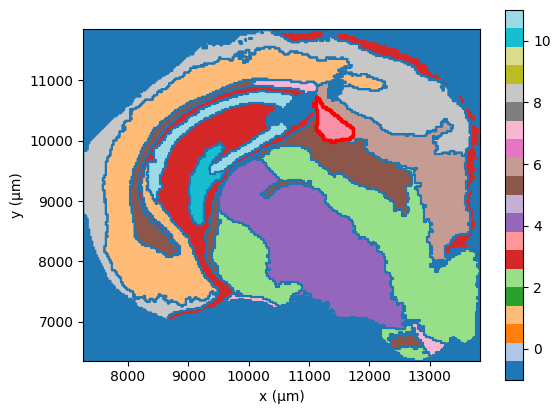

In [39]:
fig, ax = plt.subplots()
_show_grid(grid, geo, ax=ax, cmap="tab20")
_overlay_polygons(
    region,
    ax=ax,
    highlight=(7, 1),
    highlight_edge_kw={"color": "red", "linewidth": 2.5},
)

In [40]:
anatom_annot[sample] = {}
anatom_annot[sample]["fiber_tracts"] = []
anatom_annot[sample]["HIP"] = []
anatom_annot[sample]["CAsp"] = []
anatom_annot[sample]["DG-sg"] = []
anatom_annot[sample]["CTX"] = []
anatom_annot[sample]["STR"] = []
anatom_annot[sample]["VS"] = []
anatom_annot[sample]["BS/STR"] = []
anatom_annot[sample]["BS"] = []
anatom_annot[sample]["Meninges"] = []
anatom_annot[sample]["STR/CTX"] = []

anatom_annot[sample]["CTX"].append(region[0]["poly"])
anatom_annot[sample]["BS/STR"].append(region[1]["poly"])
anatom_annot[sample]["BS"].append(region[2]["poly"])
anatom_annot[sample]["BS"].append(region[3]["poly"])
anatom_annot[sample]["BS"].append(region[4]["poly"])
anatom_annot[sample]["CTX"].append(region[5]["poly"])
anatom_annot[sample]["CTX"].append(region[6]["poly"])
anatom_annot[sample]["CTX"].append(region[7]["poly"])
anatom_annot[sample]["CTX"].append(region[8]["poly"])
anatom_annot[sample]["HIP"].append(region[9]["poly"])
anatom_annot[sample]["CTX"].append(region[10]["poly"])
anatom_annot[sample]["CTX"].append(region[11]["poly"])
anatom_annot[sample]["CTX"].append(region[12]["poly"])
anatom_annot[sample]["HIP"].append(region[13]["poly"])
anatom_annot[sample]["HIP"].append(region[14]["poly"])
anatom_annot[sample]["HIP"].append(region[15]["poly"])
anatom_annot[sample]["HIP"].append(region[16]["poly"])
anatom_annot[sample]["BS"].append(region[17]["poly"])
anatom_annot[sample]["BS"].append(region[18]["poly"])
anatom_annot[sample]["BS"].append(region[19]["poly"])
anatom_annot[sample]["BS"].append(region[20]["poly"])
anatom_annot[sample]["fiber_tracts"].append(region[21]["poly"])
anatom_annot[sample]["fiber_tracts"].append(region[22]["poly"])
anatom_annot[sample]["fiber_tracts"].append(region[23]["poly"])
anatom_annot[sample]["fiber_tracts"].append(region[24]["poly"])
anatom_annot[sample]["fiber_tracts"].append(region[25]["poly"])
anatom_annot[sample]["STR"].append(region[26]["poly"])
anatom_annot[sample]["STR"].append(region[27]["poly"])
anatom_annot[sample]["STR"].append(region[28]["poly"])
anatom_annot[sample]["VS"].append(region[29]["poly"])
anatom_annot[sample]["VS"].append(region[30]["poly"])
anatom_annot[sample]["VS"].append(region[31]["poly"])
anatom_annot[sample]["VS"].append(region[32]["poly"])
anatom_annot[sample]["CTX"].append(region[33]["poly"])
anatom_annot[sample]["CTX"].append(region[34]["poly"])
anatom_annot[sample]["CTX"].append(region[35]["poly"])
anatom_annot[sample]["CTX"].append(region[36]["poly"])
anatom_annot[sample]["CTX"].append(region[37]["poly"])
anatom_annot[sample]["CTX"].append(region[38]["poly"])
anatom_annot[sample]["CTX"].append(region[39]["poly"])
anatom_annot[sample]["CTX"].append(region[40]["poly"])
anatom_annot[sample]["CTX"].append(region[41]["poly"])
anatom_annot[sample]["CTX"].append(region[42]["poly"])
anatom_annot[sample]["CTX"].append(region[43]["poly"])
anatom_annot[sample]["CTX"].append(region[44]["poly"])
anatom_annot[sample]["CTX"].append(region[45]["poly"])

In [41]:
sample = "aging_s11_r0"
grid = grids[sample]
region = regions[sample]
geo = geos[sample]
region

[{'poly': <POLYGON ((7782.561 2762.38, 7782.561 2787.382, 7782.561 2812.383, 7782.561 ...>,
  'code': 1,
  'value': 1,
  'comp_id': 0},
 {'poly': <POLYGON ((10082.696 2737.379, 10057.695 2737.379, 10032.693 2737.379, 10007...>,
  'code': 2,
  'value': 2,
  'comp_id': 0},
 {'poly': <POLYGON ((11707.791 2162.342, 11707.791 2187.343, 11732.793 2187.343, 11757...>,
  'code': 2,
  'value': 2,
  'comp_id': 1},
 {'poly': <POLYGON ((11132.758 1862.322, 11107.756 1862.322, 11107.756 1887.324, 11082...>,
  'code': 2,
  'value': 2,
  'comp_id': 2},
 {'poly': <POLYGON ((8682.614 3187.407, 8682.614 3212.409, 8657.613 3212.409, 8657.613...>,
  'code': 3,
  'value': 3,
  'comp_id': 0},
 {'poly': <POLYGON ((8382.597 3287.414, 8382.597 3312.415, 8382.597 3337.417, 8357.595...>,
  'code': 3,
  'value': 3,
  'comp_id': 1},
 {'poly': <POLYGON ((12732.851 2987.395, 12732.851 3012.396, 12757.853 3012.396, 12757...>,
  'code': 3,
  'value': 3,
  'comp_id': 2},
 {'poly': <POLYGON ((7682.556 2187.343, 7657.554

<Axes: xlabel='x (µm)', ylabel='y (µm)'>

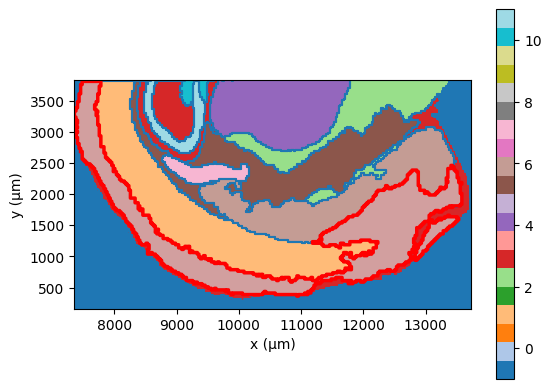

In [42]:
fig, ax = plt.subplots()
_show_grid(grid, geo, ax=ax, cmap="tab20")
_overlay_polygons(
    region,
    ax=ax,
    highlight=(8, None),
    highlight_edge_kw={"color": "red", "linewidth": 2.5},
)

In [43]:
anatom_annot[sample] = {}
anatom_annot[sample]["fiber_tracts"] = []
anatom_annot[sample]["HIP"] = []
anatom_annot[sample]["CAsp"] = []
anatom_annot[sample]["DG-sg"] = []
anatom_annot[sample]["CTX"] = []
anatom_annot[sample]["STR"] = []
anatom_annot[sample]["VS"] = []
anatom_annot[sample]["BS/STR"] = []
anatom_annot[sample]["BS"] = []
anatom_annot[sample]["Meninges"] = []
anatom_annot[sample]["STR/CTX"] = []

anatom_annot[sample]["CTX"].append(region[0]["poly"])
anatom_annot[sample]["BS"].append(region[1]["poly"])
anatom_annot[sample]["STR"].append(region[2]["poly"])
anatom_annot[sample]["STR"].append(region[3]["poly"])
anatom_annot[sample]["HIP"].append(region[4]["poly"])
anatom_annot[sample]["HIP"].append(region[5]["poly"])
anatom_annot[sample]["Meninges"].append(region[6]["poly"])
anatom_annot[sample]["Meninges"].append(region[7]["poly"])
anatom_annot[sample]["Meninges"].append(region[8]["poly"])
anatom_annot[sample]["Meninges"].append(region[9]["poly"])
anatom_annot[sample]["Meninges"].append(region[10]["poly"])
anatom_annot[sample]["BS"].append(region[11]["poly"])
anatom_annot[sample]["fiber_tracts"].append(region[12]["poly"])
anatom_annot[sample]["fiber_tracts"].append(region[13]["poly"])
anatom_annot[sample]["STR"].append(region[14]["poly"])
anatom_annot[sample]["VS"].append(region[15]["poly"])
anatom_annot[sample]["CTX"].append(region[16]["poly"])
anatom_annot[sample]["DG-sg"].append(region[17]["poly"])
anatom_annot[sample]["CAsp"].append(region[18]["poly"])

In [44]:
sample = "aging_s11_r1"
grid = grids[sample]
region = regions[sample]
geo = geos[sample]
region

[{'poly': <POLYGON ((11465.63 6062.427, 11440.628 6062.427, 11440.628 6037.425, 11415....>,
  'code': 1,
  'value': 1,
  'comp_id': 0},
 {'poly': <POLYGON ((9490.501 1012.105, 9515.503 1012.105, 9515.503 1037.107, 9490.501...>,
  'code': 1,
  'value': 1,
  'comp_id': 1},
 {'poly': <POLYGON ((7340.361 4612.334, 7315.359 4612.334, 7315.359 4637.336, 7315.359...>,
  'code': 2,
  'value': 2,
  'comp_id': 0},
 {'poly': <POLYGON ((10265.552 5337.381, 10265.552 5362.382, 10265.552 5387.384, 10265...>,
  'code': 2,
  'value': 2,
  'comp_id': 1},
 {'poly': <POLYGON ((9340.491 3412.258, 9340.491 3437.26, 9340.491 3462.261, 9315.49 3...>,
  'code': 2,
  'value': 2,
  'comp_id': 2},
 {'poly': <POLYGON ((9190.481 2762.217, 9165.48 2762.217, 9140.478 2762.217, 9140.478 ...>,
  'code': 2,
  'value': 2,
  'comp_id': 3},
 {'poly': <POLYGON ((11615.64 5587.397, 11615.64 5612.398, 11590.638 5612.398, 11590.6...>,
  'code': 3,
  'value': 3,
  'comp_id': 0},
 {'poly': <POLYGON ((10740.582 3587.269, 10765.5

<Axes: xlabel='x (µm)', ylabel='y (µm)'>

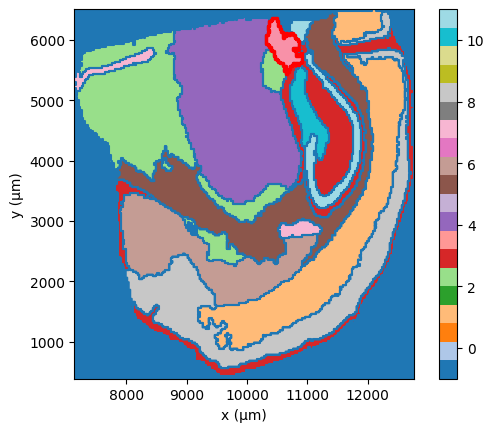

In [45]:
fig, ax = plt.subplots()
_show_grid(grid, geo, ax=ax, cmap="tab20")
_overlay_polygons(
    region,
    ax=ax,
    highlight=(7, 0),
    highlight_edge_kw={"color": "red", "linewidth": 2.5},
)

In [46]:
anatom_annot[sample] = {}
anatom_annot[sample]["fiber_tracts"] = []
anatom_annot[sample]["HIP"] = []
anatom_annot[sample]["CAsp"] = []
anatom_annot[sample]["DG-sg"] = []
anatom_annot[sample]["CTX"] = []
anatom_annot[sample]["STR"] = []
anatom_annot[sample]["VS"] = []
anatom_annot[sample]["BS/STR"] = []
anatom_annot[sample]["BS"] = []
anatom_annot[sample]["Meninges"] = []
anatom_annot[sample]["STR/CTX"] = []

anatom_annot[sample]["CTX"].append(region[0]["poly"])
anatom_annot[sample]["CTX"].append(region[1]["poly"])
anatom_annot[sample]["BS"].append(region[2]["poly"])
anatom_annot[sample]["BS"].append(region[3]["poly"])
anatom_annot[sample]["BS"].append(region[4]["poly"])
anatom_annot[sample]["STR"].append(region[5]["poly"])
anatom_annot[sample]["CTX"].append(region[6]["poly"])
anatom_annot[sample]["HIP"].append(region[7]["poly"])
anatom_annot[sample]["Meninges"].append(region[8]["poly"])
anatom_annot[sample]["HIP"].append(region[9]["poly"])
anatom_annot[sample]["STR"].append(region[10]["poly"])
anatom_annot[sample]["BS"].append(region[11]["poly"])
anatom_annot[sample]["fiber_tracts"].append(region[12]["poly"])
anatom_annot[sample]["STR"].append(region[13]["poly"])
anatom_annot[sample]["VS"].append(region[14]["poly"])
anatom_annot[sample]["VS"].append(region[15]["poly"])
anatom_annot[sample]["VS"].append(region[16]["poly"])
anatom_annot[sample]["CTX"].append(region[17]["poly"])
anatom_annot[sample]["CTX"].append(region[18]["poly"])
anatom_annot[sample]["DG-sg"].append(region[19]["poly"])
anatom_annot[sample]["CAsp"].append(region[20]["poly"])
anatom_annot[sample]["CAsp"].append(region[21]["poly"])

In [47]:
sample = "aging_s11_r2"
grid = grids[sample]
region = regions[sample]
geo = geos[sample]
region

[{'poly': <POLYGON ((262.434 7770.987, 237.433 7770.987, 237.433 7745.985, 212.431 774...>,
  'code': 1,
  'value': 1,
  'comp_id': 0},
 {'poly': <POLYGON ((1137.484 3895.735, 1137.484 3920.737, 1137.484 3945.738, 1162.485...>,
  'code': 2,
  'value': 2,
  'comp_id': 0},
 {'poly': <POLYGON ((612.454 6445.901, 587.453 6445.901, 562.451 6445.901, 562.451 647...>,
  'code': 2,
  'value': 2,
  'comp_id': 1},
 {'poly': <POLYGON ((712.46 4370.766, 712.46 4395.768, 687.458 4395.768, 687.458 4420....>,
  'code': 2,
  'value': 2,
  'comp_id': 2},
 {'poly': <POLYGON ((612.454 7045.939, 612.454 7070.941, 612.454 7095.943, 587.453 709...>,
  'code': 3,
  'value': 3,
  'comp_id': 0},
 {'poly': <POLYGON ((2887.584 3570.714, 2862.583 3570.714, 2837.581 3570.714, 2837.581...>,
  'code': 3,
  'value': 3,
  'comp_id': 1},
 {'poly': <POLYGON ((512.448 5370.831, 512.448 5395.832, 512.448 5420.834, 487.447 542...>,
  'code': 4,
  'value': 4,
  'comp_id': 0},
 {'poly': <POLYGON ((262.434 7320.957, 262.434 7

<Axes: xlabel='x (µm)', ylabel='y (µm)'>

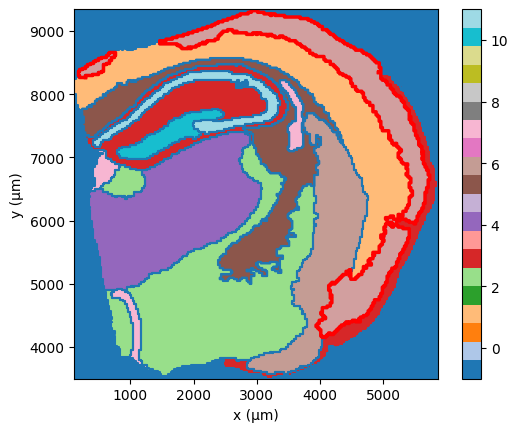

In [48]:
fig, ax = plt.subplots()
_show_grid(grid, geo, ax=ax, cmap="tab20")
_overlay_polygons(
    region,
    ax=ax,
    highlight=(8, None),
    highlight_edge_kw={"color": "red", "linewidth": 2.5},
)

In [49]:
anatom_annot[sample] = {}
anatom_annot[sample]["fiber_tracts"] = []
anatom_annot[sample]["HIP"] = []
anatom_annot[sample]["CAsp"] = []
anatom_annot[sample]["DG-sg"] = []
anatom_annot[sample]["CTX"] = []
anatom_annot[sample]["STR"] = []
anatom_annot[sample]["VS"] = []
anatom_annot[sample]["BS/STR"] = []
anatom_annot[sample]["BS"] = []
anatom_annot[sample]["Meninges"] = []
anatom_annot[sample]["STR/CTX"] = []

anatom_annot[sample]["CTX"].append(region[0]["poly"])
anatom_annot[sample]["BS/STR"].append(region[1]["poly"])
anatom_annot[sample]["BS"].append(region[2]["poly"])
anatom_annot[sample]["BS"].append(region[3]["poly"])
anatom_annot[sample]["HIP"].append(region[4]["poly"])
anatom_annot[sample]["Meninges"].append(region[5]["poly"])
anatom_annot[sample]["BS"].append(region[6]["poly"])
anatom_annot[sample]["fiber_tracts"].append(region[7]["poly"])
anatom_annot[sample]["STR"].append(region[8]["poly"])
anatom_annot[sample]["VS"].append(region[9]["poly"])
anatom_annot[sample]["VS"].append(region[10]["poly"])
anatom_annot[sample]["VS"].append(region[11]["poly"])
anatom_annot[sample]["CTX"].append(region[12]["poly"])
anatom_annot[sample]["CTX"].append(region[13]["poly"])
anatom_annot[sample]["DG-sg"].append(region[14]["poly"])
anatom_annot[sample]["CAsp"].append(region[15]["poly"])

In [50]:
sample = "aging_s12_r0"
grid = grids[sample]
region = regions[sample]
geo = geos[sample]
region

[{'poly': <POLYGON ((887.478 2887.244, 887.478 2912.246, 887.478 2937.248, 887.478 296...>,
  'code': 1,
  'value': 1,
  'comp_id': 0},
 {'poly': <POLYGON ((3187.631 4787.378, 3187.631 4812.38, 3212.632 4812.38, 3212.632 4...>,
  'code': 2,
  'value': 2,
  'comp_id': 0},
 {'poly': <POLYGON ((3112.626 2987.251, 3087.624 2987.251, 3087.624 3012.253, 3062.622...>,
  'code': 2,
  'value': 2,
  'comp_id': 1},
 {'poly': <POLYGON ((4512.719 2687.23, 4512.719 2712.232, 4487.717 2712.232, 4462.715 ...>,
  'code': 2,
  'value': 2,
  'comp_id': 2},
 {'poly': <POLYGON ((3437.647 2087.188, 3412.646 2087.188, 3412.646 2112.19, 3387.644 ...>,
  'code': 2,
  'value': 2,
  'comp_id': 3},
 {'poly': <POLYGON ((1762.536 5687.442, 1737.534 5687.442, 1737.534 5712.443, 1712.533...>,
  'code': 3,
  'value': 3,
  'comp_id': 0},
 {'poly': <POLYGON ((1487.518 3362.278, 1487.518 3387.28, 1462.516 3387.28, 1462.516 3...>,
  'code': 3,
  'value': 3,
  'comp_id': 1},
 {'poly': <POLYGON ((2037.554 4762.376, 2037.554

<Axes: xlabel='x (µm)', ylabel='y (µm)'>

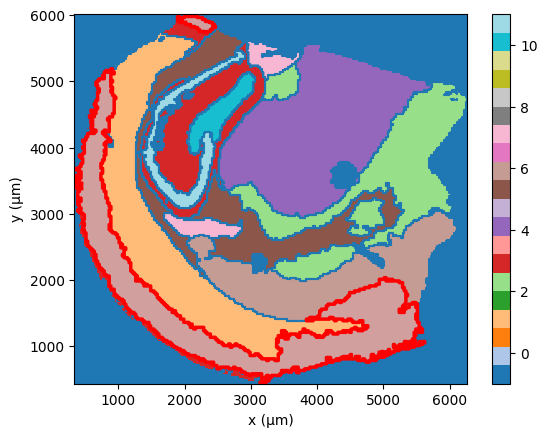

In [51]:
fig, ax = plt.subplots()
_show_grid(grid, geo, ax=ax, cmap="tab20")
_overlay_polygons(
    region,
    ax=ax,
    highlight=(8, None),
    highlight_edge_kw={"color": "red", "linewidth": 2.5},
)

In [52]:
anatom_annot[sample] = {}
anatom_annot[sample]["fiber_tracts"] = []
anatom_annot[sample]["HIP"] = []
anatom_annot[sample]["CAsp"] = []
anatom_annot[sample]["DG-sg"] = []
anatom_annot[sample]["CTX"] = []
anatom_annot[sample]["STR"] = []
anatom_annot[sample]["VS"] = []
anatom_annot[sample]["BS/STR"] = []
anatom_annot[sample]["BS"] = []
anatom_annot[sample]["Meninges"] = []
anatom_annot[sample]["STR/CTX"] = []

anatom_annot[sample]["CTX"].append(region[0]["poly"])
anatom_annot[sample]["BS"].append(region[1]["poly"])
anatom_annot[sample]["BS/STR"].append(region[2]["poly"])
anatom_annot[sample]["STR"].append(region[3]["poly"])
anatom_annot[sample]["STR"].append(region[4]["poly"])
anatom_annot[sample]["CTX"].append(region[5]["poly"])
anatom_annot[sample]["HIP"].append(region[6]["poly"])
anatom_annot[sample]["HIP"].append(region[7]["poly"])
anatom_annot[sample]["HIP"].append(region[8]["poly"])
anatom_annot[sample]["HIP"].append(region[9]["poly"])
anatom_annot[sample]["HIP"].append(region[10]["poly"])
anatom_annot[sample]["Meninges"].append(region[11]["poly"])
anatom_annot[sample]["Meninges"].append(region[12]["poly"])
anatom_annot[sample]["HIP"].append(region[13]["poly"])
anatom_annot[sample]["Meninges"].append(region[14]["poly"])
anatom_annot[sample]["Meninges"].append(region[15]["poly"])
anatom_annot[sample]["Meninges"].append(region[16]["poly"])
anatom_annot[sample]["Meninges"].append(region[17]["poly"])
anatom_annot[sample]["BS"].append(region[18]["poly"])
anatom_annot[sample]["BS"].append(region[19]["poly"])
anatom_annot[sample]["BS"].append(region[20]["poly"])
anatom_annot[sample]["BS"].append(region[21]["poly"])
anatom_annot[sample]["fiber_tracts"].append(region[22]["poly"])
anatom_annot[sample]["fiber_tracts"].append(region[23]["poly"])
anatom_annot[sample]["fiber_tracts"].append(region[24]["poly"])
anatom_annot[sample]["STR"].append(region[25]["poly"])
anatom_annot[sample]["VS"].append(region[26]["poly"])
anatom_annot[sample]["VS"].append(region[27]["poly"])
anatom_annot[sample]["CTX"].append(region[28]["poly"])
anatom_annot[sample]["CTX"].append(region[29]["poly"])
anatom_annot[sample]["CTX"].append(region[30]["poly"])
anatom_annot[sample]["CTX"].append(region[31]["poly"])
anatom_annot[sample]["CTX"].append(region[32]["poly"])
anatom_annot[sample]["CTX"].append(region[33]["poly"])
anatom_annot[sample]["CTX"].append(region[34]["poly"])
anatom_annot[sample]["CTX"].append(region[35]["poly"])
anatom_annot[sample]["DG-sg"].append(region[36]["poly"])
anatom_annot[sample]["CAsp"].append(region[37]["poly"])

## cell mapping

In [53]:
adata_points = sc.read_h5ad(
    "/dss/dsshome1/00/ra87rib/cellseg-benchmark/analysis/aging/Cellpose_1_nuclei_model/adatas/adata_integrated.h5ad.gz"
)
adata_points

AnnData object with n_obs × n_vars = 670543 × 500
    obs: 'region', 'slide', 'cell_type_incl_low_quality_revised', 'cell_type_mmc_incl_low_quality_clusters', 'cell_type_mmc_incl_low_quality', 'cell_type_incl_mixed_revised', 'cell_type_mmc_incl_mixed_clusters', 'cell_type_mmc_incl_mixed', 'cell_type_revised', 'cell_type_mmc_raw_clusters', 'cell_type_mmc_raw', 'area', 'volume_sum', 'volume_final', 'num_z_planes', 'size_normalized', 'surface_to_volume_ratio', 'sphericity', 'solidity', 'elongation', 'genotype', 'age_months', 'run_date', 'organism', 'cohort', 'sample', 'animal_id', 'condition', 'path', 'n_counts', 'n_genes', 'spatial_outlier', 'low_quality_cell', 'volume_outlier_cell', 'fov'
    var: 'n_cells'
    uns: 'X_umap_20_50', 'X_umap_harmony_20_50', 'X_umap_harmony_20_50_3d', 'cell_type_revised_colors', 'condition_colors', 'neighbors_harmony_20_50', 'pca', 'sample_colors', 'slide_colors'
    obsm: 'Ovrlpy_stats', 'X_pca', 'X_pca_harmony', 'X_umap_20_50', 'X_umap_harmony_20_50', 'X

/tmp/ipykernel_2834388/579713673.py:884: FutureWarning: Use obsm (e.g. `k in adata.obsm` or `adata.obsm.keys() | {'u'}`) instead of AnnData.obsm_keys, AnnData.obsm_keys is deprecated and will be removed in the future.
  if coord_key not in adata.obsm_keys():


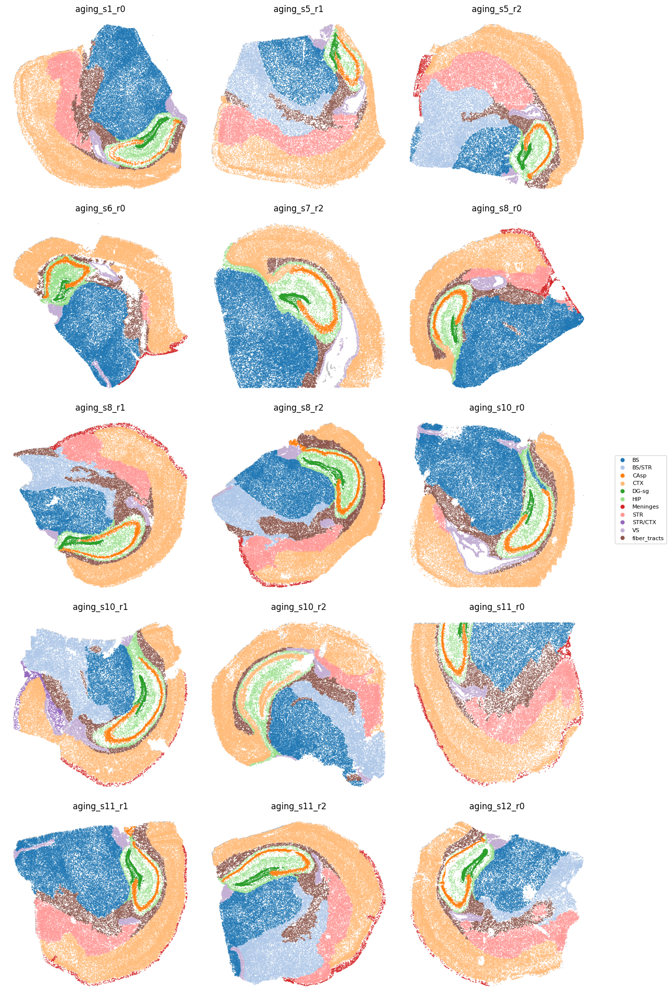

In [55]:
results = map_points_to_regions_from_anndata(
    adata_points,
    regions_by_slide=anatom_annot,
    coord_key="spatial_microns",
    slide_key="sample",
    include_boundary=True,  # boundary-inclusive assignment
    dissolve=False,  # set True if you want to merge touching polys per label first
    index_kind="name",  # return obs_names as indices; use 'pos' for integer positions
    return_df=True,
)
df_all = pd.concat([v["df"] for v in results.values()], ignore_index=True)
df_all = df_all.set_index("obs_id").reindex(adata_points.obs_names)
adata_points.obs["region_mapped"] = df_all["label"].values
adata_points.obs["region_poly_index"] = df_all["poly_index"].values
plot_spatial_multiplot(adata_points, "region_mapped")
plt.show()

In [56]:
df_all.to_csv(
    "/dss/dsshome1/00/ra87rib/cellseg-benchmark/analysis/aging/Cellpose_1_nuclei_model/spatial_registration.csv"
)

In [63]:
gdf = to_gdf(anatom_annot)
gdf.to_parquet(
    "/dss/dsshome1/00/ra87rib/cellseg-benchmark/misc/brain_regions/aging_brain_regions.parquet"
)

## loading

In [64]:
gdf = gpd.read_parquet(
    "/dss/dsshome1/00/ra87rib/cellseg-benchmark/misc/brain_regions/aging_brain_regions.parquet"
)
reconstructed = {}
for (sample, label), sub in gdf.groupby(["sample", "label"]):
    reconstructed.setdefault(sample, {})[label] = list(sub.geometry)
reconstructed

{'aging_s10_r0': {'BS': [<POLYGON ((12007.809 3362.419, 11982.807 3362.419, 11982.807 3387.42, 11982....>,
   <POLYGON ((7932.57 4387.484, 7907.569 4387.484, 7882.567 4387.484, 7882.567 ...>,
   <POLYGON ((7607.551 3487.427, 7607.551 3512.428, 7607.551 3537.43, 7582.55 3...>,
   <POLYGON ((10832.74 4387.484, 10832.74 4412.486, 10807.739 4412.486, 10807.7...>,
   <POLYGON ((8057.577 3087.401, 8057.577 3112.403, 8032.576 3112.403, 8032.576...>,
   <POLYGON ((9907.686 2762.38, 9907.686 2787.382, 9907.686 2812.383, 9882.684 ...>,
   <POLYGON ((7707.557 3212.409, 7707.557 3237.411, 7707.557 3262.412, 7732.558...>],
  'CAsp': [<POLYGON ((12582.843 4287.478, 12582.843 4312.48, 12557.841 4312.48, 12557.8...>,
   <POLYGON ((11032.752 1037.27, 11007.75 1037.27, 11007.75 1062.271, 10982.749...>],
  'CTX': [<POLYGON ((9407.657 137.212, 9407.657 162.213, 9382.655 162.213, 9382.655 18...>,
   <POLYGON ((12257.824 3762.444, 12257.824 3787.446, 12232.822 3787.446, 12232...>,
   <POLYGON ((7407.539 962